In [1]:
%matplotlib inline
import pandas as pd

import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import seaborn as sns
import numpy as np

from helpers import *

from matplotlib import pyplot

import pycwt
from pycwt.helpers import find

In [2]:
SAVE = True

### Info delivered with ONI NOAA
Warm (red) and cold (blue) periods based on a threshold of +/- 0.5oC for the Oceanic Niño Index (ONI) [3 month running mean of ERSST.v5 SST anomalies in the Niño 3.4 region (5oN-5oS, 120o-170oW)], based on centered 30-year base periods updated every 5 years.
https://origin.cpc.ncep.noaa.gov/products/analysis_monitoring/ensostuff/ONI_change.shtml

For historical purposes, periods of below and above normal SSTs are colored in blue and red when the threshold is met for a minimum of 5 consecutive overlapping seasons. The ONI is one measure of the El Niño-Southern Oscillation, and other indices can confirm whether features consistent with a coupled ocean-atmosphere phenomenon accompanied these periods.

In [3]:
enso = {
    'Equatorial SOI': get_ts_from_df("./Indices/ENSO/Equatorial SOI.txt", skiprows=4, missing_value=999.9),
    'Equatorial SOI Eastern Pacific': get_ts_from_df("./Indices/ENSO/Equatorial SOI_Eastern_Pacific.txt", skiprows=4, missing_value=999.9),
    'Equatorial SOI Indonesia': get_ts_from_df("./Indices/ENSO/Equatorial SOI_Indonesia.txt", skiprows=4, missing_value=999.9),
    
    ## Extracting only anomaly values, but dataframe contains also TOTAL and ClimAdjust columns
    'Niño 3.4': get_ts_from_df("./Indices/ENSO/nino3_4_NOAA.txt", skiprows=7, skipfooter=7, missing_value=-99.99),
    'Niño 4': get_ts_from_df("./Indices/ENSO/nino4.txt", skiprows=5, skipfooter=7, missing_value=-99.99),
    'Niño 1+2': get_ts_from_df("./Indices/ENSO/nino_1_2.txt", skiprows=5, skipfooter=7, missing_value=-99.99),
    'Niño 3': get_ts_from_df("./Indices/ENSO/nino_3.txt", skiprows=5, skipfooter=7, missing_value=-99.99),
    'SOI from Bureau of Meteorology': get_ts_from_df("./Indices/ENSO/SOI_Bureau_of_Meteorology_au.txt", skiprows=7),
    'SOI from CRU': get_ts_from_df("./Indices/ENSO/SOI_CRU.txt", skiprows=1, drop_cols=12, missing_value=-99.99),
    'SOI from NOAA': get_ts_from_df("./Indices/ENSO/SOI_NOAA.txt", skiprows=89, missing_value=-999.9),
    'Oceanic Niño Index': get_ts_from_xlsx("./Indices/ENSO/ONI_NOAA.xlsx", skiprows=2),
    'EMI Modoki': extract_time_series(pd.read_csv("./Indices/ENSO/EMI_JAMSTEC.txt", sep='[\s+:]', skiprows=5, header=None, usecols=[0,1,7], names=['YR','MON','INDEX']))
}

amo = {
    'AMO': get_ts_from_df("./Indices/AMO.txt", skiprows=4, skipfooter=4, missing_value=-99.99)
}

pdo = {
    'PDO': get_ts_from_df("./Indices/PDO_NOAA.txt", skiprows=32, skipfooter=11)
}

nao = {
    'NAO from CRU': get_ts_from_df("./Indices/NAO/NAO_CRU.txt", skiprows=7, missing_value=-99.99, drop_cols=12),
    'NAO - Hurrell index': get_ts_from_df("./Indices/NAO/NAO_Hurrel.txt", skiprows=3, missing_value=-999.),
    'NAO - PC-based Hurrell index': get_ts_from_df("./Indices/NAO/NAO_Hurrel_PC_based.txt", skiprows=2, missing_value=-999.),
    'NAO from NOAA': get_ts_from_df("./Indices/NAO/NAO_NOAA.txt", skiprows=2),
    
    ## In the last row, four tail values had been separated using tab spacing, 
    ## though in the original file they were connected creating single invalid value
    'North Atlantic Oscillation The Rogers': get_ts_from_df("./Indices/NAO/NAO__Rogers_Azores_mslp.txt", skiprows=4, missing_value=-9999.)
}

/home/imegirin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  from ipykernel import kernelapp as app


## ENSO phases

In [4]:
el_nino_oni = phase_table(enso['Oceanic Niño Index'], "El Nino")
la_nina_oni = phase_table(enso['Oceanic Niño Index'], "La Nina")
el_nino_oni.to_excel('charts_and_tables/ENSO/tables/ElNino_LaNina/ONI El Nino Episodes.xlsx')
la_nina_oni.to_excel('charts_and_tables/ENSO/tables/ElNino_LaNina/ONI La Nina Episodes.xlsx')

el_nino_3_4 = phase_table(enso['Niño 3.4'].rolling(window=5).mean().dropna(), "El Nino", 0.4, 6)
la_nina_3_4 = phase_table(enso['Niño 3.4'].rolling(window=5).mean().dropna(), "La Nina", 0.4, 6)
el_nino_3_4.to_excel('charts_and_tables/ENSO/tables/ElNino_LaNina/Nino3.4 El Nino Episodes.xlsx')
la_nina_3_4.to_excel('charts_and_tables/ENSO/tables/ElNino_LaNina/Nino3.4 La Nina Episodes.xlsx')

## Plotting ENSO phases

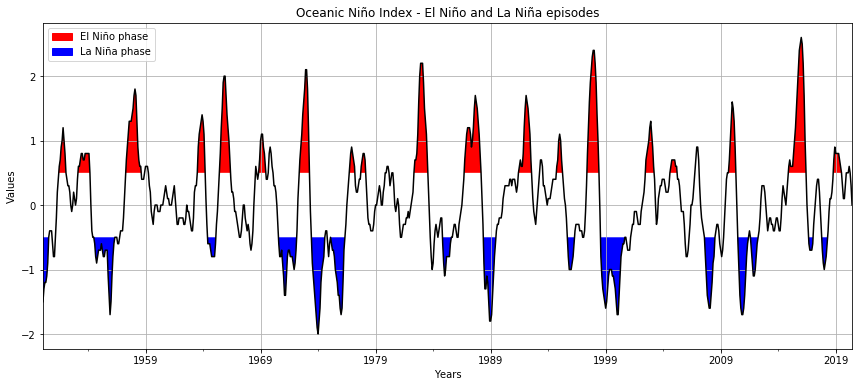

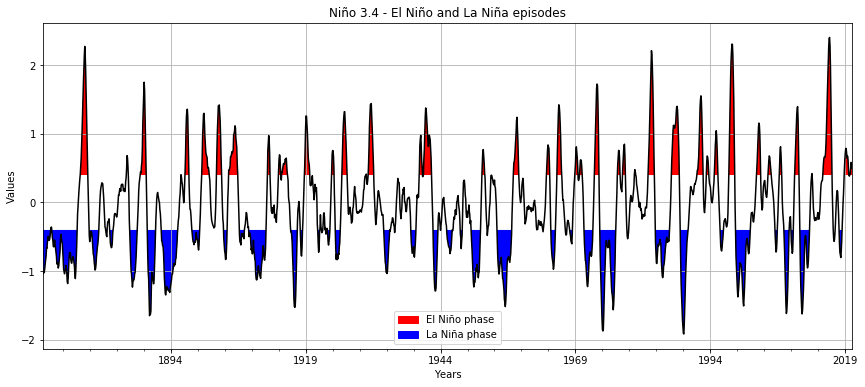

In [5]:
plot_phases(enso['Oceanic Niño Index'], 'Oceanic Niño Index', abs_tsh=.5, save_as="charts_and_tables/ENSO/ElNino_LaNina/ONI - El Nino and La Nina.png")
plot_phases(enso['Niño 3.4'].rolling(window=5).mean().dropna(), 'Niño 3.4', abs_tsh=.4, save_as="charts_and_tables/ENSO/ElNino_LaNina/Nino3.4 - El Nino and La Nina.png")

## ENSO variability

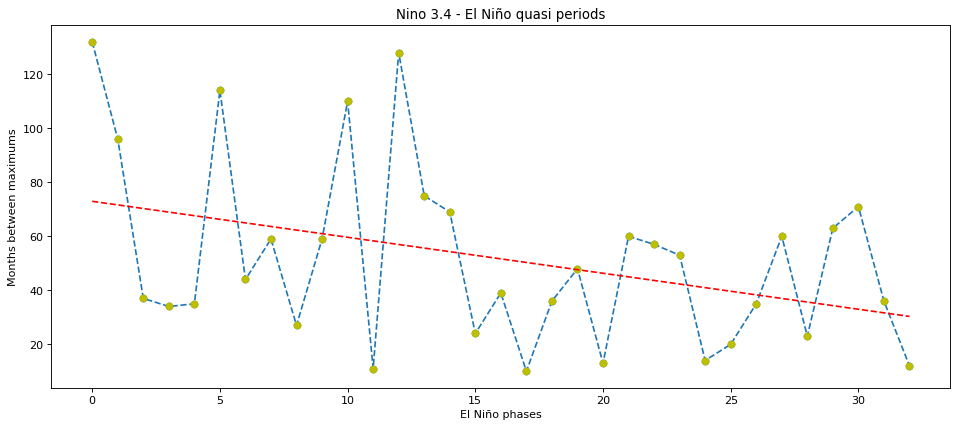

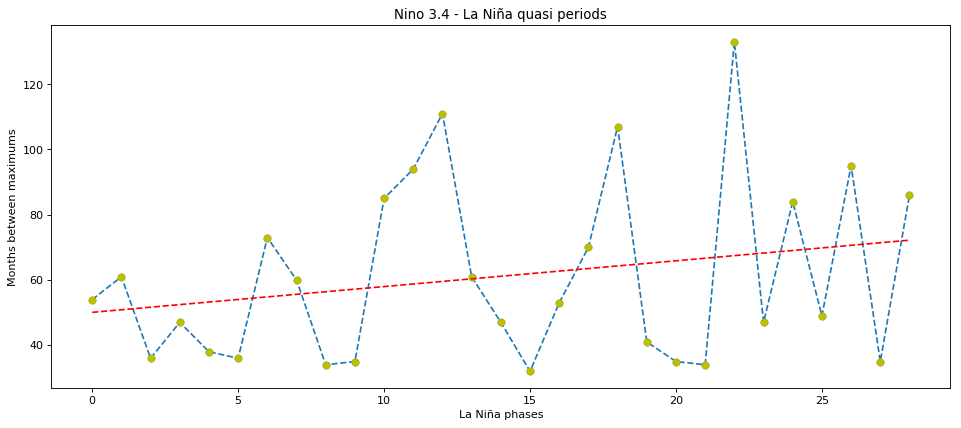

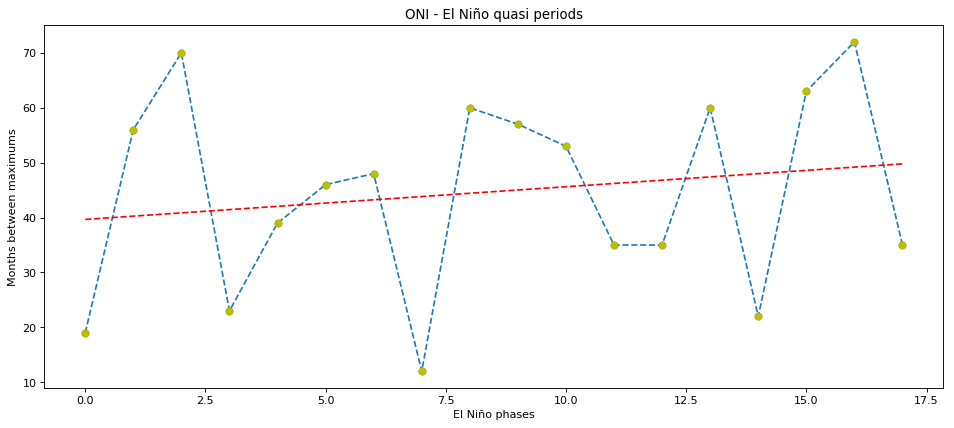

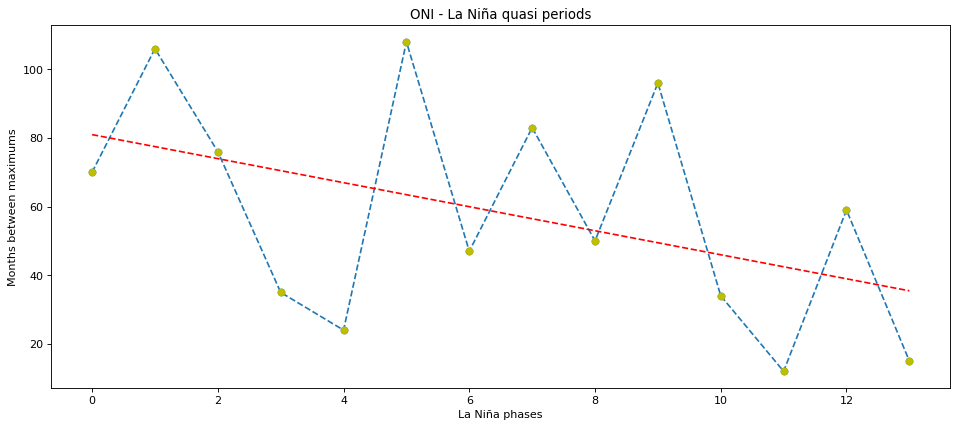

In [6]:
quasi_periods_el_nino_3_4 = time_between_extremes(el_nino_3_4) 
quasi_periods_el_nino_oni = time_between_extremes(el_nino_oni) 
quasi_periods_la_nina_3_4 = time_between_extremes(la_nina_3_4) 
quasi_periods_la_nina_oni = time_between_extremes(la_nina_oni) 

plot_enso_variability(quasi_periods_el_nino_3_4, True, "Nino 3.4 - El Niño quasi periods", y_label="Months between maximums", save_as="charts_and_tables/ENSO/additional_materials/semi_periodicity/Nino3.4/Nino 3.4 - El Nino quasi periods.png")
plot_enso_variability(quasi_periods_la_nina_3_4, False, "Nino 3.4 - La Niña quasi periods", y_label="Months between maximums", save_as="charts_and_tables/ENSO/additional_materials/semi_periodicity/Nino3.4/Nino 3.4 - La Nina quasi periods.png")
plot_enso_variability(quasi_periods_el_nino_oni, True, "ONI - El Niño quasi periods", y_label="Months between maximums", save_as="charts_and_tables/ENSO/additional_materials/semi_periodicity/ONI/ONI - El Nino quasi periods.png")
plot_enso_variability(quasi_periods_la_nina_oni, False, "ONI - La Niña quasi periods", y_label="Months between maximums", save_as="charts_and_tables/ENSO/additional_materials/semi_periodicity/ONI/ONI - La Nina quasi periods.png")

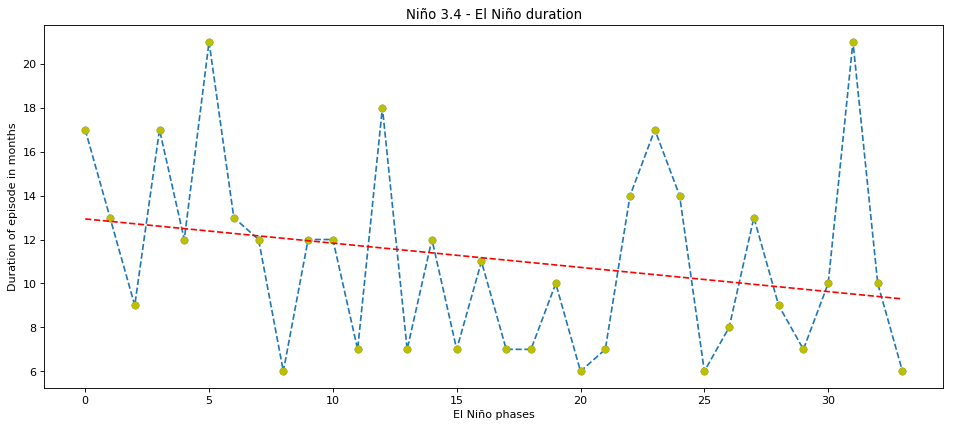

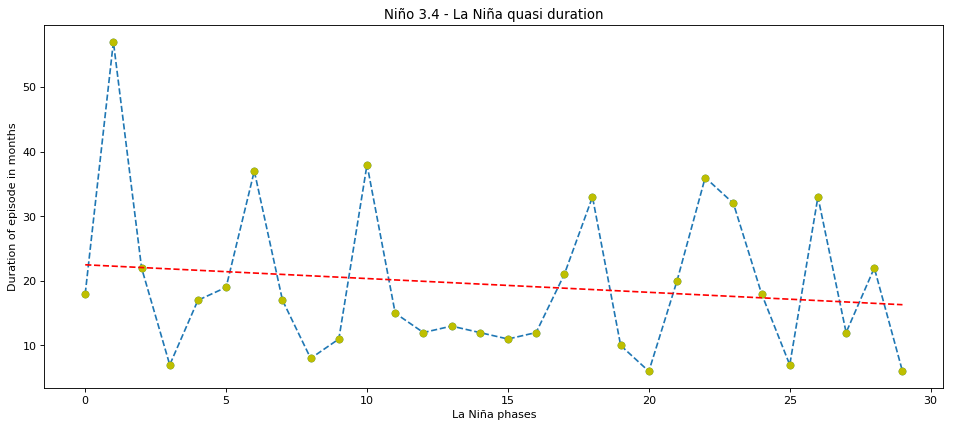

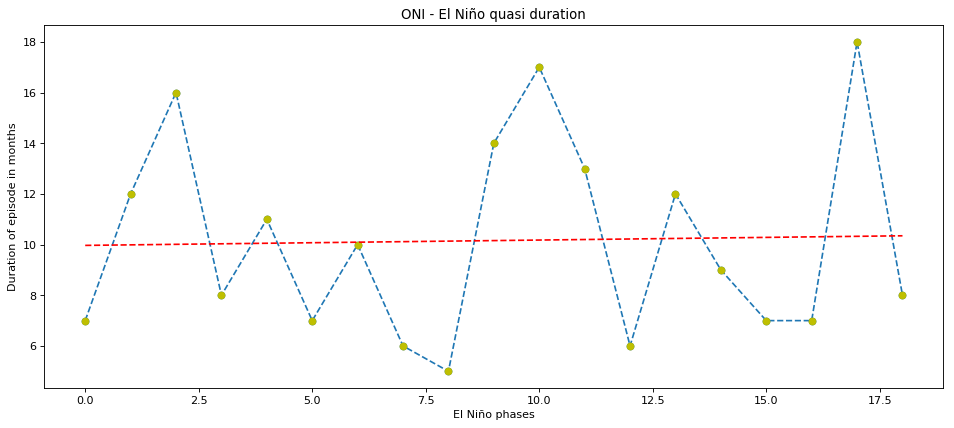

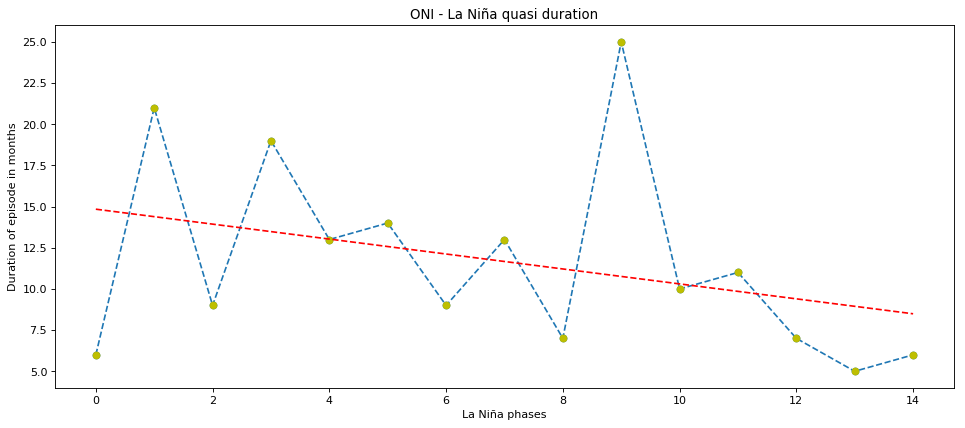

In [7]:
# Duration of periods
plot_enso_variability(data_to_numpy(el_nino_3_4['Duration of episode in months']), True, "Niño 3.4 - El Niño duration", y_label="Duration of episode in months", save_as="charts_and_tables/ENSO/additional_materials/semi_periodicity/Nino3.4/Nino 3.4 - El Nino duration of phases.png")
plot_enso_variability(data_to_numpy(la_nina_3_4['Duration of episode in months']), False, "Niño 3.4 - La Niña quasi duration", y_label="Duration of episode in months", save_as="charts_and_tables/ENSO/additional_materials/semi_periodicity/Nino3.4/Nino 3.4 - La Nina duration  of phases.png")
plot_enso_variability(data_to_numpy(el_nino_oni['Duration of episode in months']), True, "ONI - El Niño quasi duration", y_label="Duration of episode in months", save_as="charts_and_tables/ENSO/additional_materials/semi_periodicity/ONI/ONI - El Nino duration of phases.png")
plot_enso_variability(data_to_numpy(la_nina_oni['Duration of episode in months']), False, "ONI - La Niña quasi duration", y_label="Duration of episode in months", save_as="charts_and_tables/ENSO/additional_materials/semi_periodicity/ONI/ONI - La Nina duration of phases.png")

## Is El Nino a valid name?

In [8]:
during_max_3_4 = []
beginning_3_4 = []
end_3_4 = []
during_el_nino_3_4 = []
for i in range(1, 13):
    stats = statistics_for_month(el_nino_3_4, i)
    during_max_3_4.append(stats[0])
    beginning_3_4.append(stats[1])
    end_3_4.append(stats[2])
    during_el_nino_3_4.append(stats[3])
    
during_max_oni = []
beginning_oni = []
end_oni = []
during_el_nino_oni = []
for i in range(1, 13):
    stats = statistics_for_month(el_nino_oni, i)
    during_max_oni.append(stats[0])
    beginning_oni.append(stats[1])
    end_oni.append(stats[2])
    during_el_nino_oni.append(stats[3])

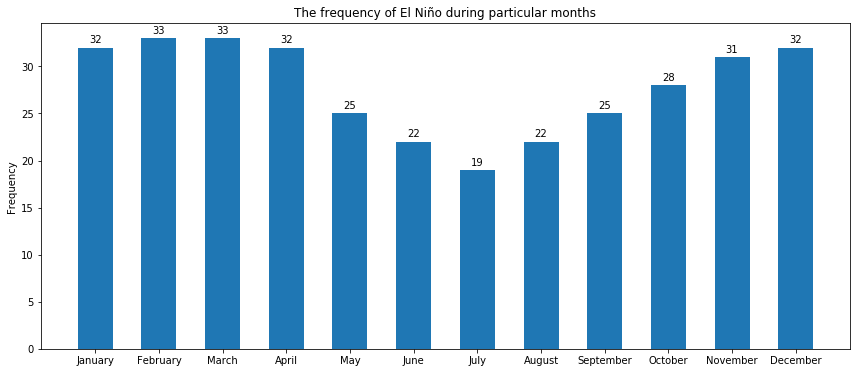

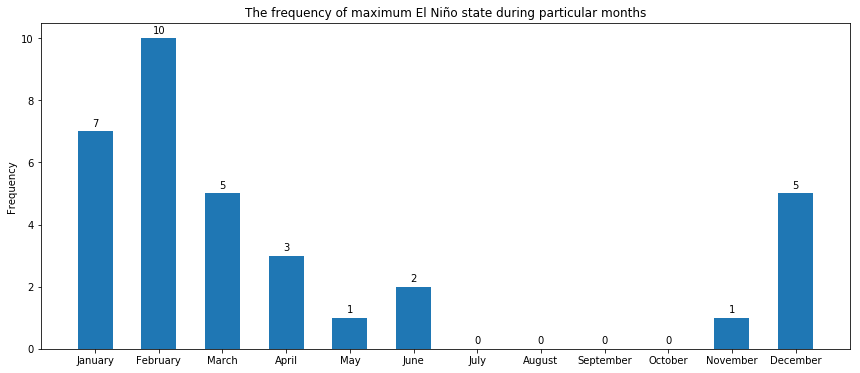

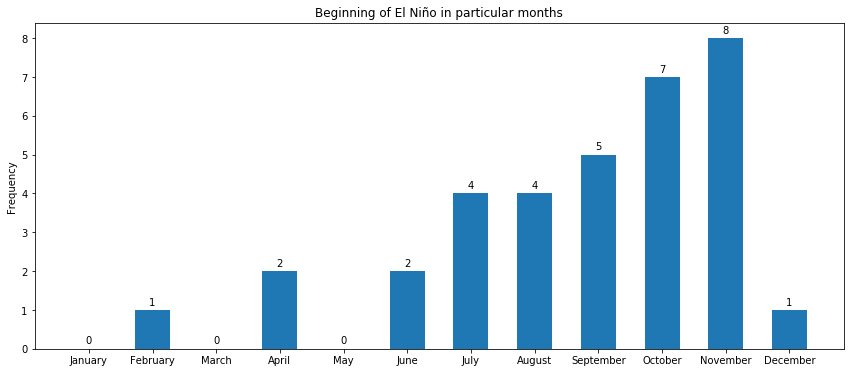

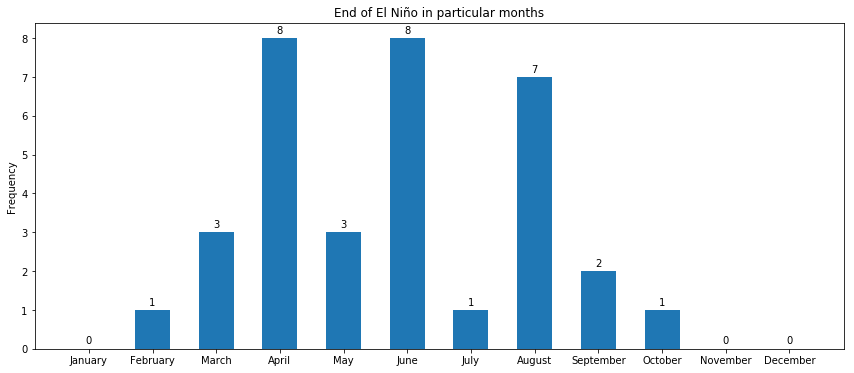

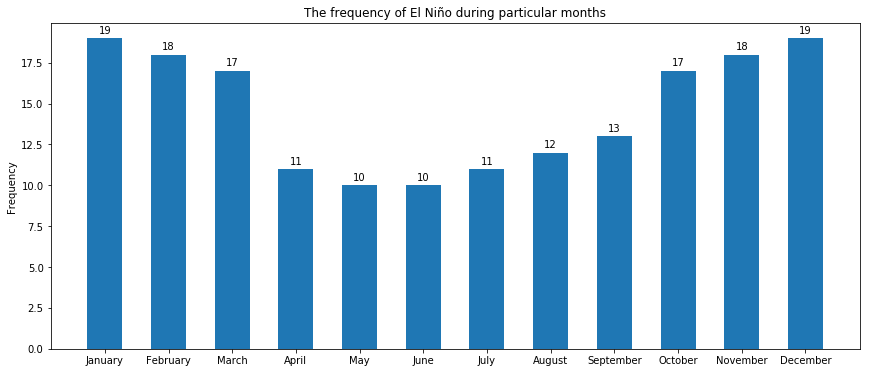

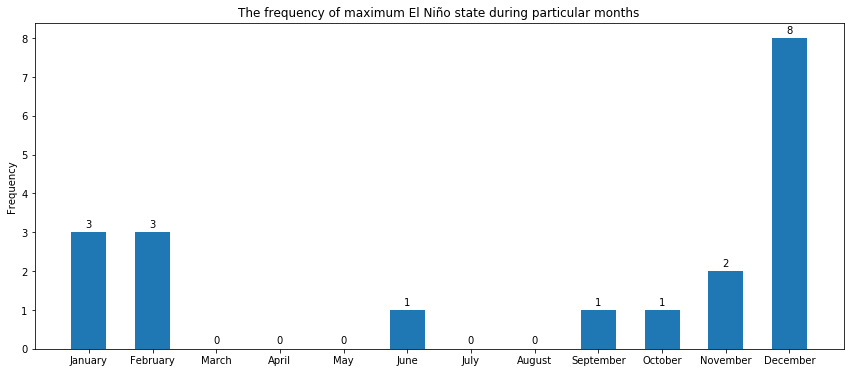

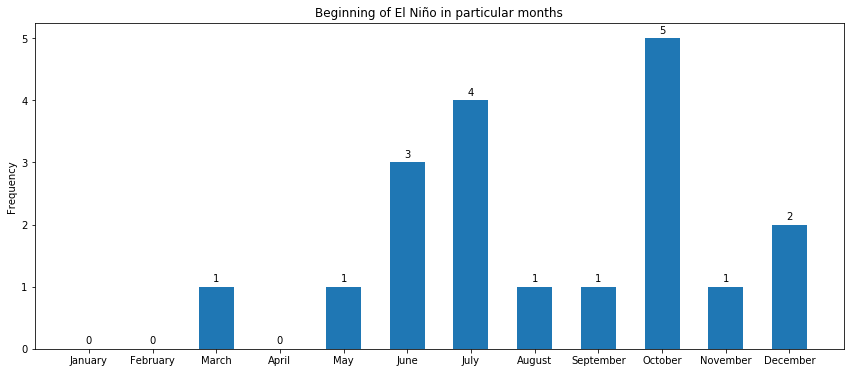

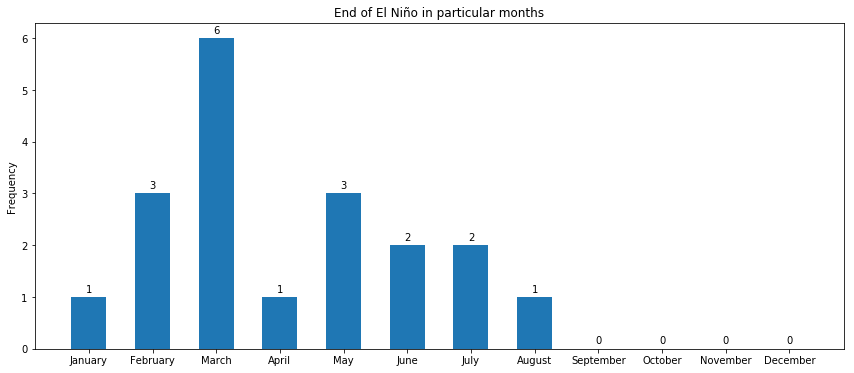

In [10]:
plot_month_statistic(during_el_nino_3_4, "The frequency of El Niño during particular months", "charts_and_tables/ENSO/additional_materials/ElNino_name/Nino3.4/Nino3.4 - El Nino - frequency.png")
plot_month_statistic(during_max_3_4, "The frequency of maximum El Niño state during particular months", "charts_and_tables/ENSO/additional_materials/ElNino_name/Nino3.4/Nino3.4 - El Nino maximum.png")
plot_month_statistic(beginning_3_4, "Beginning of El Niño in particular months", "charts_and_tables/ENSO/additional_materials/ElNino_name/Nino3.4/Nino3.4 - El Nino - beginning.png")
plot_month_statistic(end_3_4, "End of El Niño in particular months", "charts_and_tables/ENSO/additional_materials/ElNino_name/Nino3.4/Nino3.4 - El Nino - end.png")

plot_month_statistic(during_el_nino_oni, "The frequency of El Niño during particular months", "charts_and_tables/ENSO/additional_materials/ElNino_name/ONI/ONI - El Nino - frequency.png")
plot_month_statistic(during_max_oni, "The frequency of maximum El Niño state during particular months", "charts_and_tables/ENSO/additional_materials/ElNino_name/ONI/ONI - El Nino maximum.png")
plot_month_statistic(beginning_oni, "Beginning of El Niño in particular months", "charts_and_tables/ENSO/additional_materials/ElNino_name/ONI/ONI - El Nino - beginning.png")
plot_month_statistic(end_oni, "End of El Niño in particular months", "charts_and_tables/ENSO/additional_materials/ElNino_name/ONI/ONI - El Nino - end.png")

In [11]:
decembers_nino_3_4 = []
for i in el_nino_3_4['Time at maximum']:
    if i.month == 12:
        decembers_nino_3_4.append(i)
        
decembers_oni = []
for i in el_nino_oni['Time at maximum']:
    if i.month == 12:
        decembers_oni.append(i)

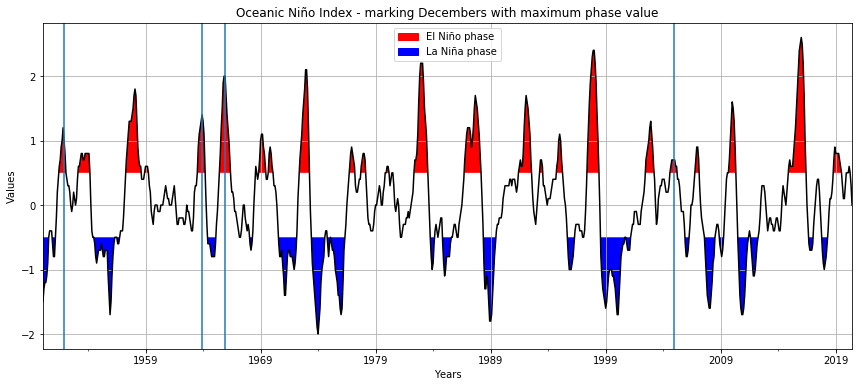

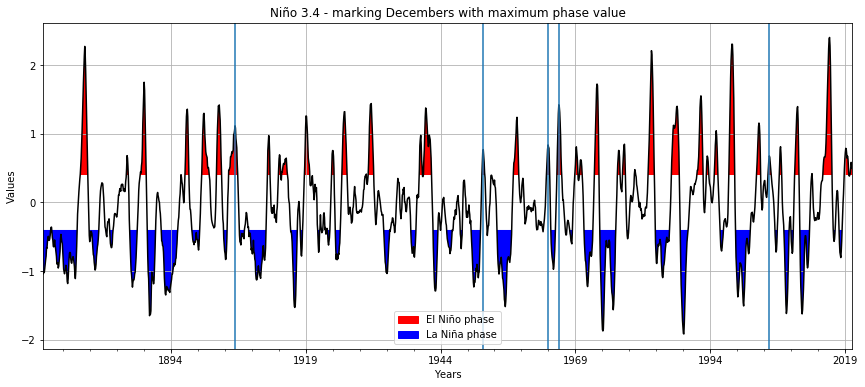

In [12]:
plot_phases_december(enso['Oceanic Niño Index'], 'Oceanic Niño Index',decembers_oni, decembers_nino_3_4, abs_tsh=.5, minlen=5, save_as="charts_and_tables/ENSO/additional_materials/ElNino_name/ONI/ONI - El Nino and La Nina - December maximum.png")
plot_phases_december(enso['Niño 3.4'].rolling(window=5).mean().dropna(), 'Niño 3.4', decembers_oni, decembers_nino_3_4, abs_tsh=.4, minlen=6, save_as="charts_and_tables/ENSO/additional_materials/ElNino_name/Nino3.4/Nino3.4 - El Nino and La Nina - December maximum.png")

## NAO phases

In [13]:
for threshold in [.3, .4, .5, .6]:
    for months in [3, 4, 5]:
        how_many_phases(nao['NAO from NOAA'], months, threshold)

3 0.3
Positive:  284
Negative:  277
4 0.3
Positive:  273
Negative:  249
5 0.3
Positive:  237
Negative:  239
3 0.4
Positive:  239
Negative:  242
4 0.4
Positive:  215
Negative:  208
5 0.4
Positive:  193
Negative:  192
3 0.5
Positive:  189
Negative:  201
4 0.5
Positive:  160
Negative:  173
5 0.5
Positive:  144
Negative:  160
3 0.6
Positive:  153
Negative:  167
4 0.6
Positive:  118
Negative:  140
5 0.6
Positive:  97
Negative:  118


In [14]:
for threshold in [.3, .4, .5, .6]:
    for months in [3, 4, 5]:
        how_many_phases(enso['Niño 3.4'], months, threshold)

3 0.3
Positive:  484
Negative:  746
4 0.3
Positive:  479
Negative:  730
5 0.3
Positive:  484
Negative:  730
3 0.4
Positive:  407
Negative:  651
4 0.4
Positive:  405
Negative:  640
5 0.4
Positive:  404
Negative:  639
3 0.5
Positive:  353
Negative:  551
4 0.5
Positive:  341
Negative:  558
5 0.5
Positive:  346
Negative:  545
3 0.6
Positive:  304
Negative:  462
4 0.6
Positive:  299
Negative:  464
5 0.6
Positive:  292
Negative:  449


In [16]:
for months_len in [4, 5, 6]:
    phase_table(nao['NAO from NOAA'].rolling(window=3).mean().dropna(), "El Nino", abs_threshold=.4, minlen=months_len).to_excel('charts_and_tables/NAO/phases/{} months period/Positive phases - 3 months running mean - 0.4 threshold.xlsx'.format(months_len))
    phase_table(nao['NAO from NOAA'].rolling(window=3).mean().dropna(), "La Nina", abs_threshold=.4, minlen=months_len).to_excel('charts_and_tables/NAO/phases/{} months period/Negative phases - 3 months running mean - 0.4 threshold.xlsx'.format(months_len))

    phase_table(nao['NAO from NOAA'].rolling(window=4).mean().dropna(), "El Nino", abs_threshold=.4, minlen=months_len).to_excel('charts_and_tables/NAO/phases/{} months period/Positive phases - 4 months running mean - 0.4 threshold.xlsx'.format(months_len))
    phase_table(nao['NAO from NOAA'].rolling(window=4).mean().dropna(), "La Nina", abs_threshold=.4, minlen=months_len).to_excel('charts_and_tables/NAO/phases/{} months period/Negative phases - 4 months running mean - 0.4 threshold.xlsx'.format(months_len))

    phase_table(nao['NAO from NOAA'].rolling(window=5).mean().dropna(), "El Nino", abs_threshold=.3, minlen=months_len).to_excel('charts_and_tables/NAO/phases/{} months period/Positive phases - 5 months running mean - 0.3 threshold.xlsx'.format(months_len))
    phase_table(nao['NAO from NOAA'].rolling(window=5).mean().dropna(), "La Nina", abs_threshold=.3, minlen=months_len).to_excel('charts_and_tables/NAO/phases/{} months period/Negative phases - 5 months running mean - 0.3 threshold.xlsx'.format(months_len))

## Plotting NAO phases

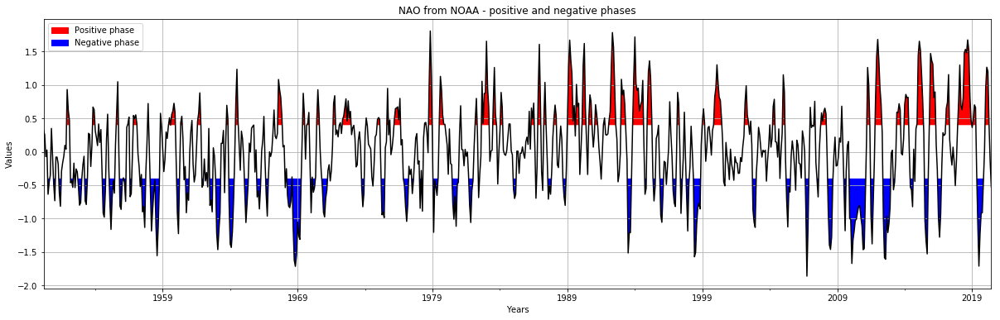

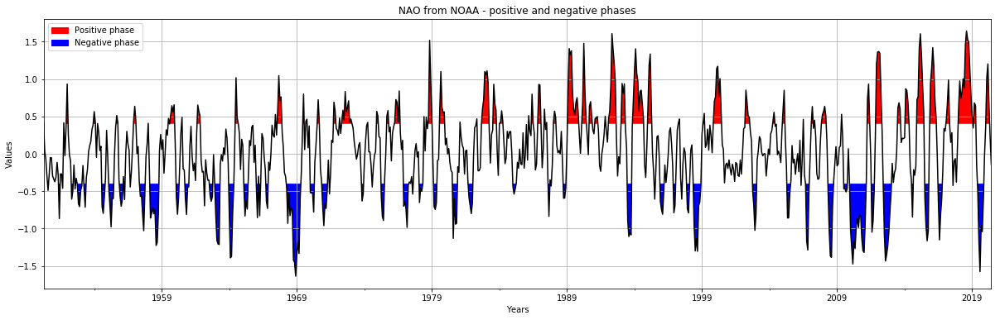

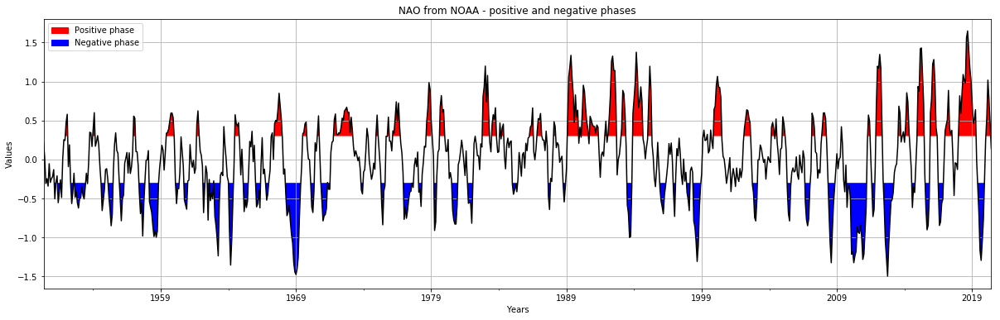

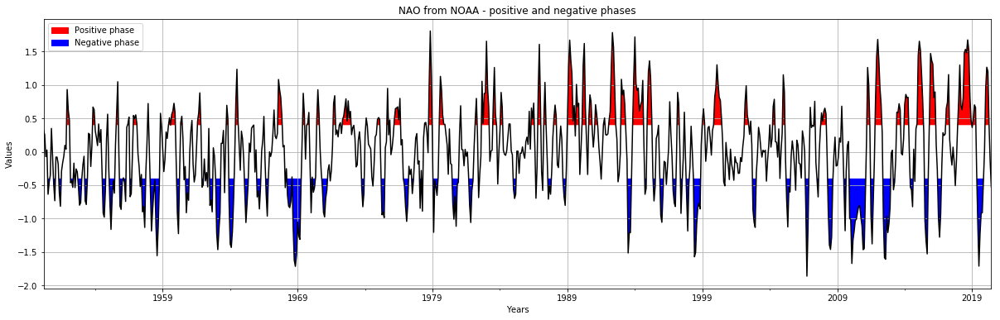

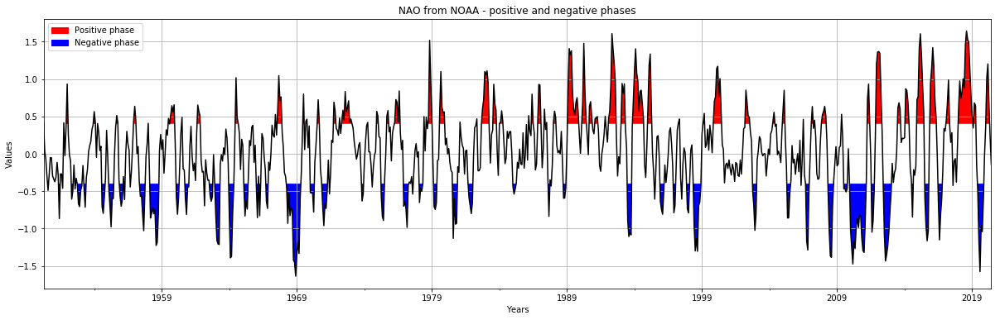

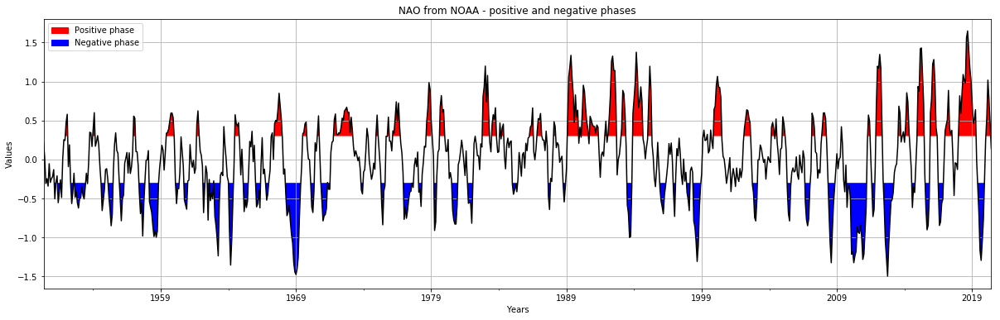

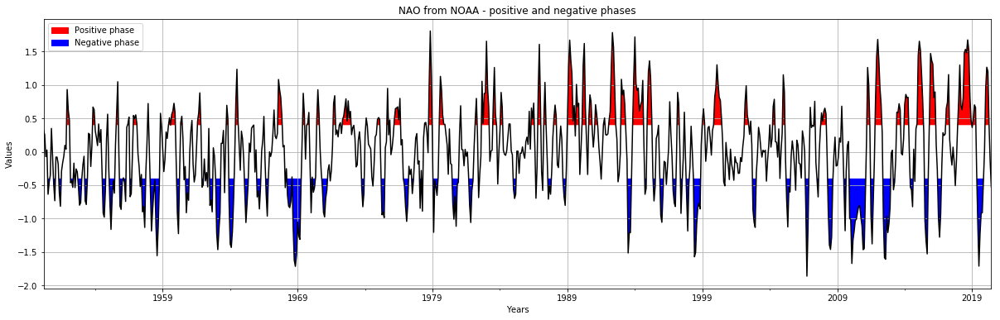

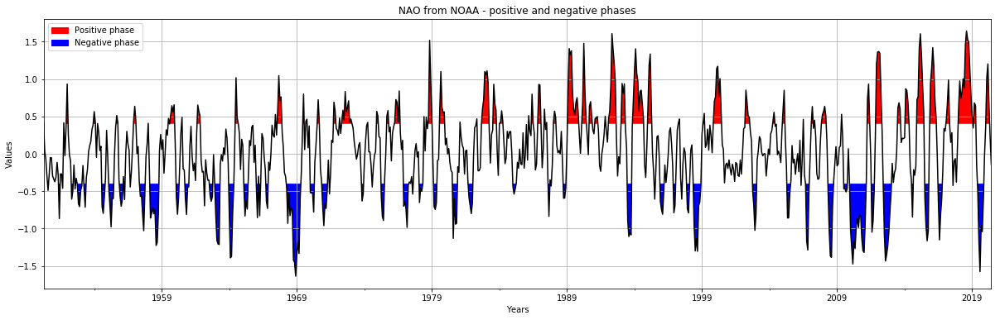

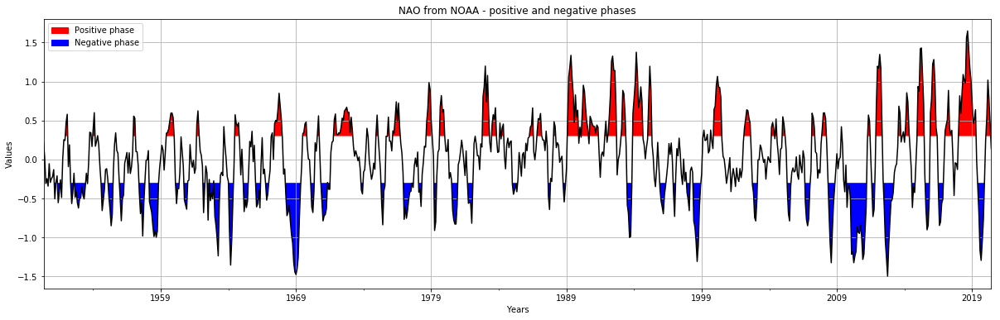

In [17]:
for months_len in [4, 5, 6]:
    plot_phases_nao(nao['NAO from NOAA'].rolling(window=3).mean().dropna(), 'NAO from NOAA', months_len, abs_tsh=.4, minlen=months_len, save_as="charts_and_tables/NAO/phases/{} months period/NAO - phases - 3 months running mean - 0.4 threshold.png")
    plot_phases_nao(nao['NAO from NOAA'].rolling(window=4).mean().dropna(), 'NAO from NOAA', months_len, abs_tsh=.4, minlen=months_len, save_as="charts_and_tables/NAO/phases/{} months period/NAO - phases - 4 months running mean - 0.4 threshold.png")
    plot_phases_nao(nao['NAO from NOAA'].rolling(window=5).mean().dropna(), 'NAO from NOAA', months_len, abs_tsh=.3, minlen=months_len, save_as="charts_and_tables/NAO/phases/{} months period/NAO - phases - 5 months running mean - 0.3 threshold.png")

## Excursion tables

In [18]:
rolling_mean_months = [5, 12, 36, 60]

for months in rolling_mean_months:
    excursion_tables_for_group(enso, months, "charts_and_tables/ENSO/tables/excursion{}/{}.xlsx")
    excursion_tables_for_group(amo, months, "charts_and_tables/AMO/tables/excursion{}/{}.xlsx")
    excursion_tables_for_group(pdo, months, "charts_and_tables/PDO/tables/excursion{}/{}.xlsx")
    excursion_tables_for_group(nao, months, "charts_and_tables/NAO/tables/excursion{}/{}.xlsx")
    
excursion_tables_for_group(enso, 1, "charts_and_tables/ENSO/tables/excursion/{}.xlsx")
excursion_tables_for_group(amo, 1, "charts_and_tables/AMO/tables/excursion/{}.xlsx")
excursion_tables_for_group(pdo, 1, "charts_and_tables/PDO/tables/excursion/{}.xlsx")
excursion_tables_for_group(nao, 1, "charts_and_tables/NAO/tables/excursion/{}.xlsx")

## Single plots to indices

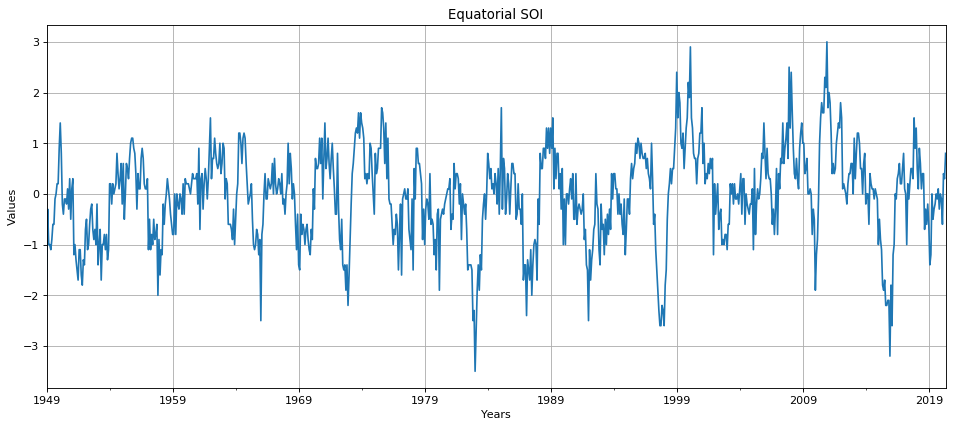

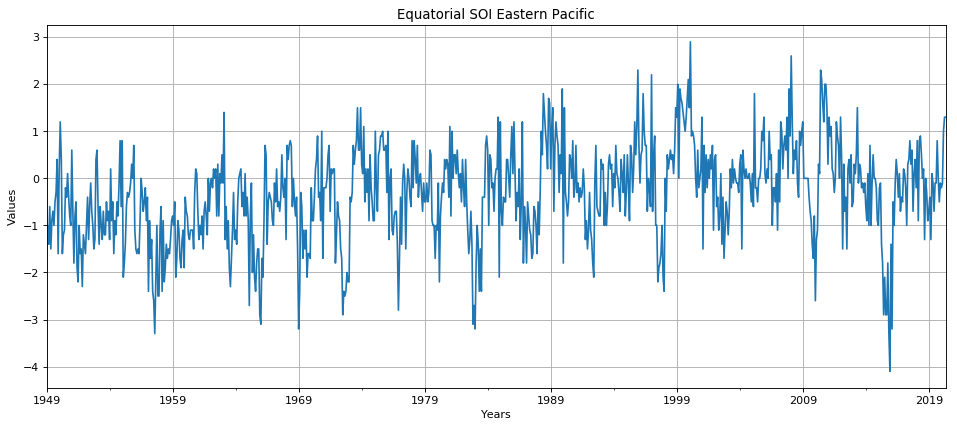

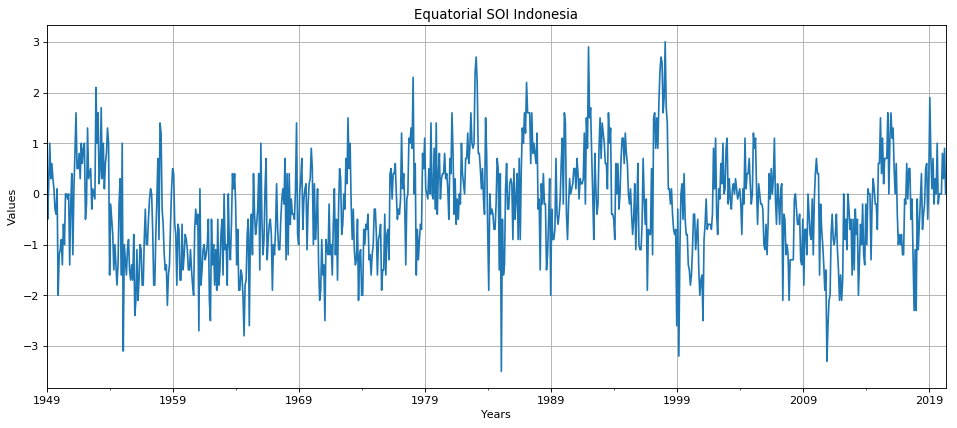

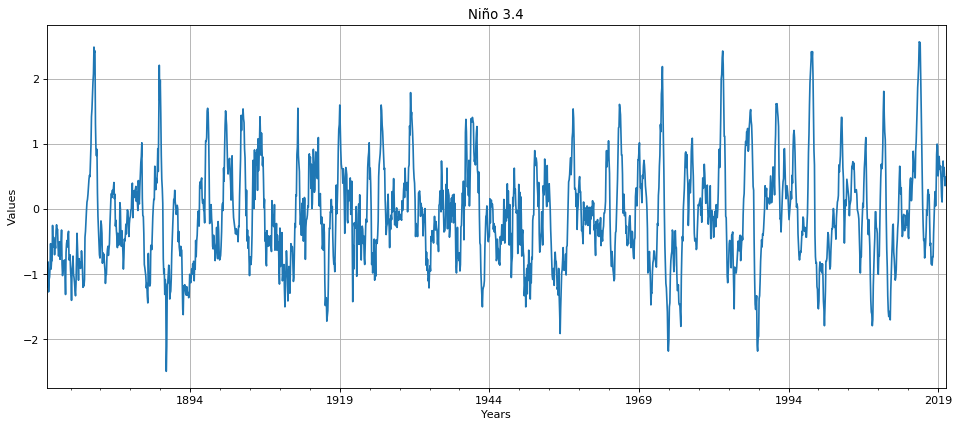

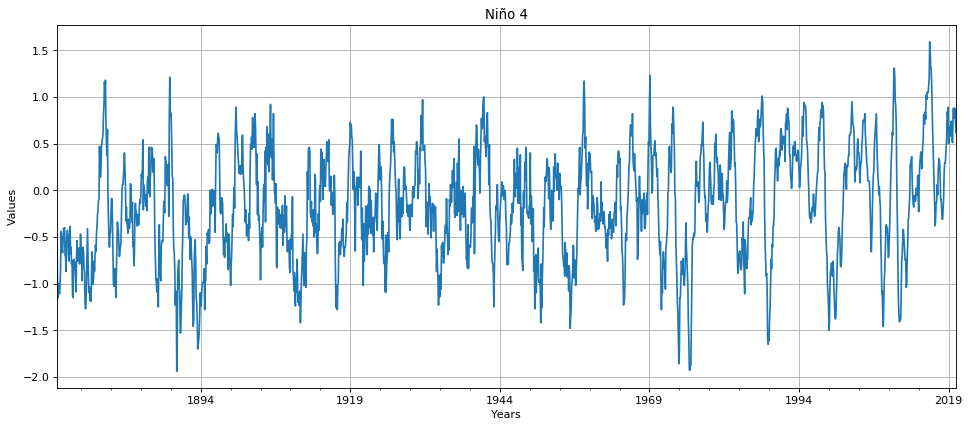

...

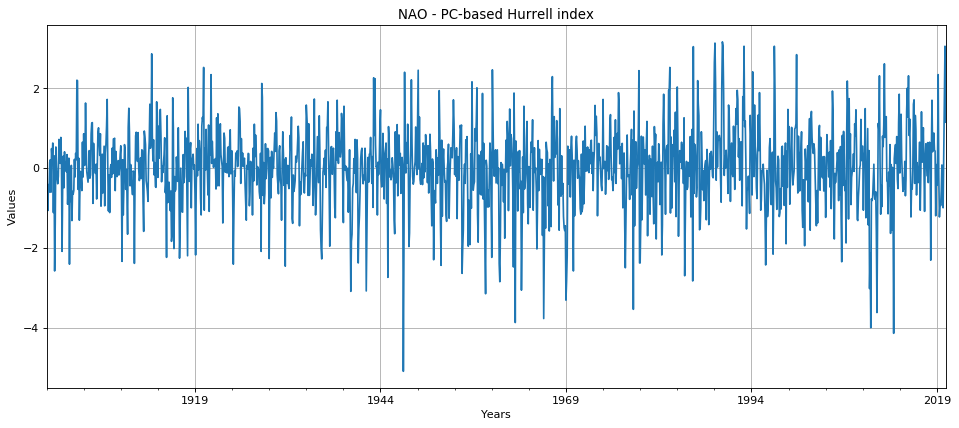

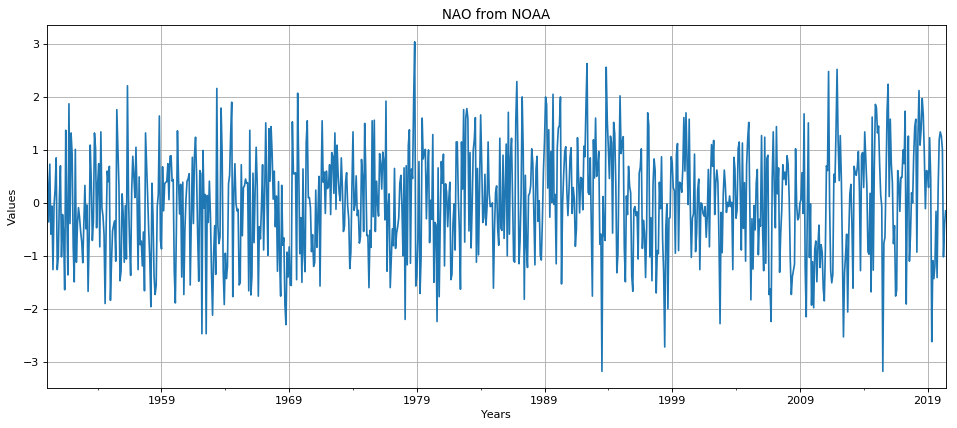

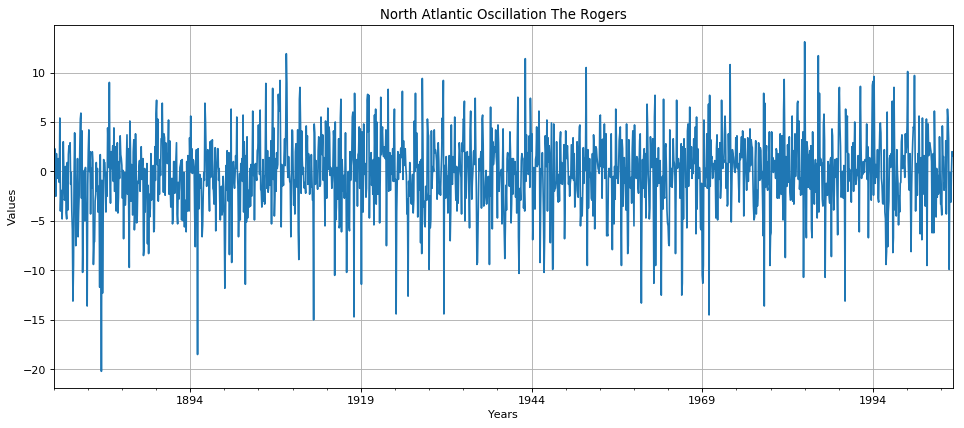

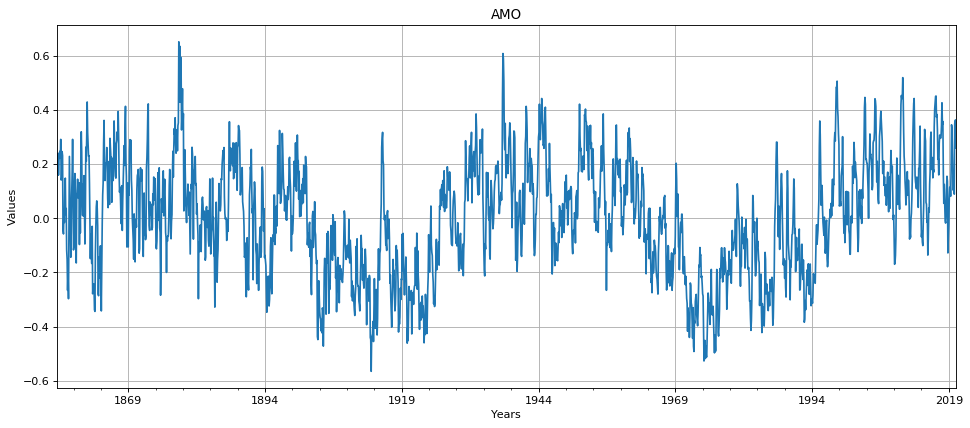

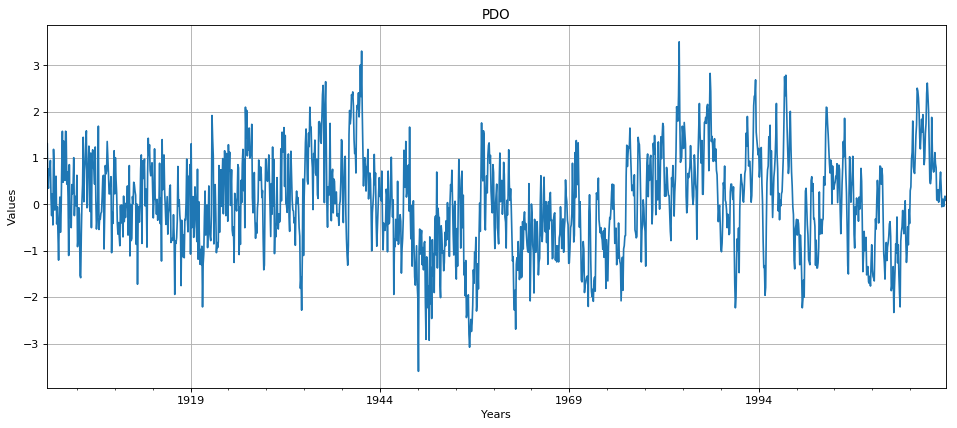

In [19]:
plot_all(enso, "charts_and_tables/ENSO/charts/indices/{}.png")
plot_all(nao, "charts_and_tables/NAO/charts/indices/{}.png")
plot_all(amo, "charts_and_tables/AMO/charts/indices/{}.png")
plot_all(pdo, "charts_and_tables/PDO/charts/indices/{}.png")

## Autocorrelation

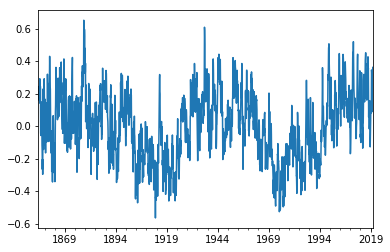

In [20]:
amo['AMO'].plot()
plt.show()

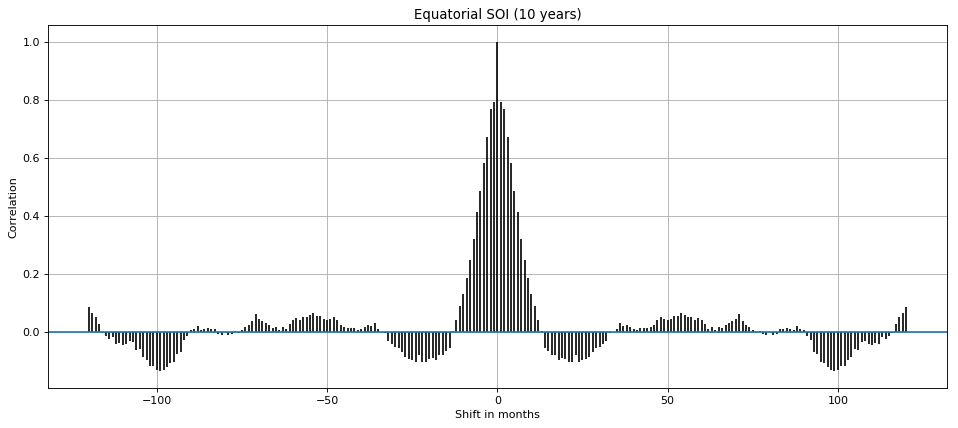

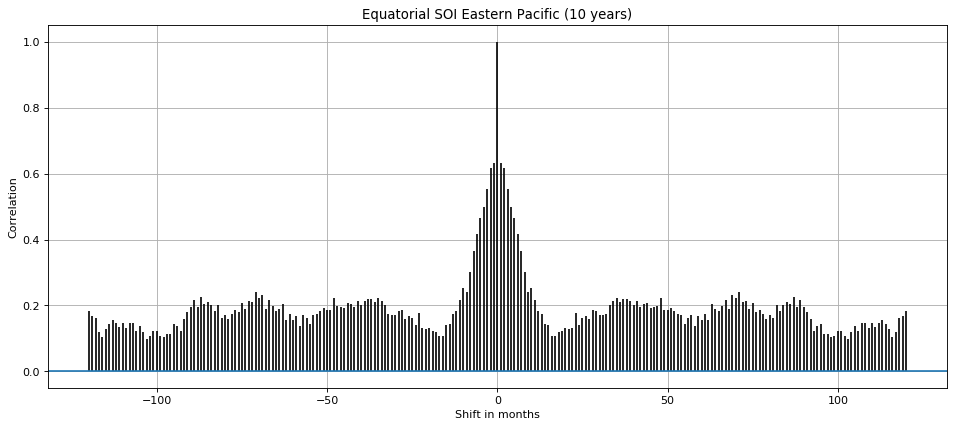

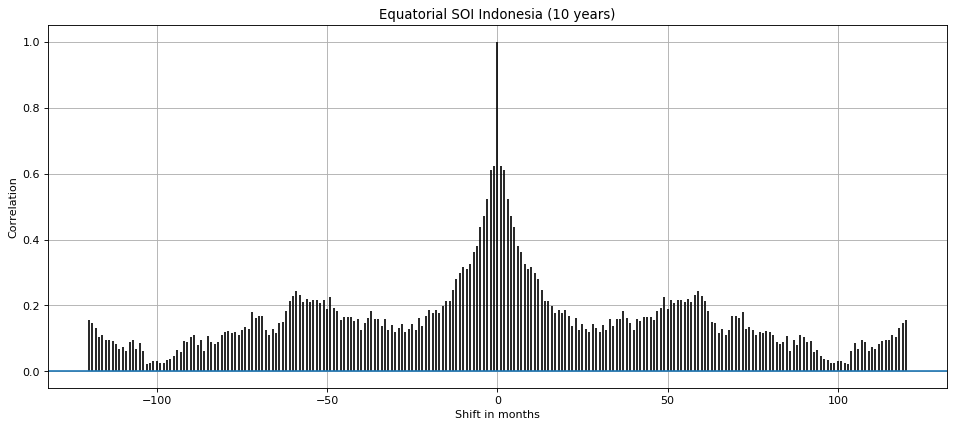

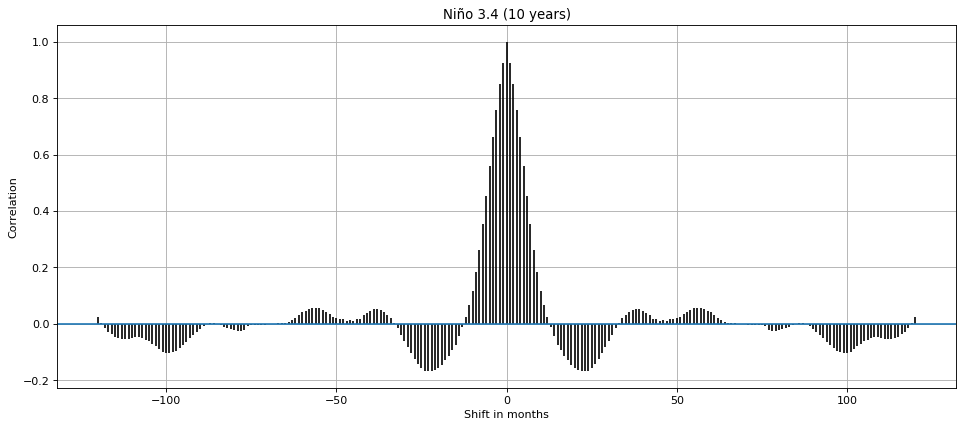

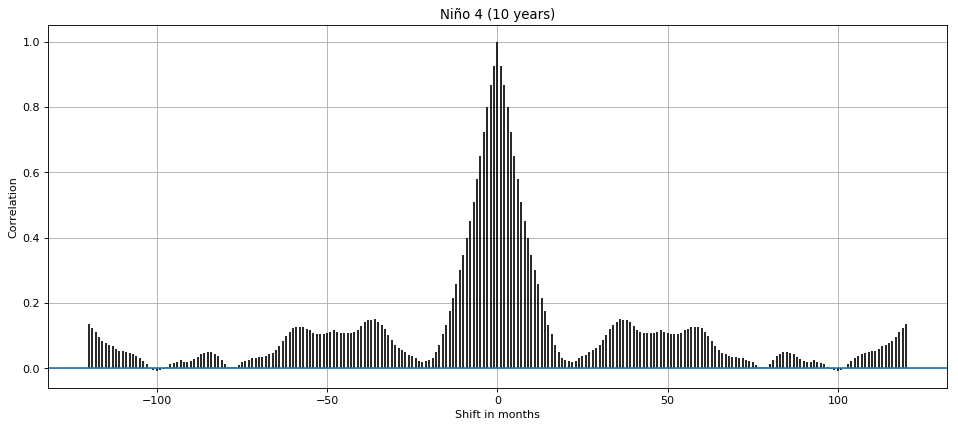

...

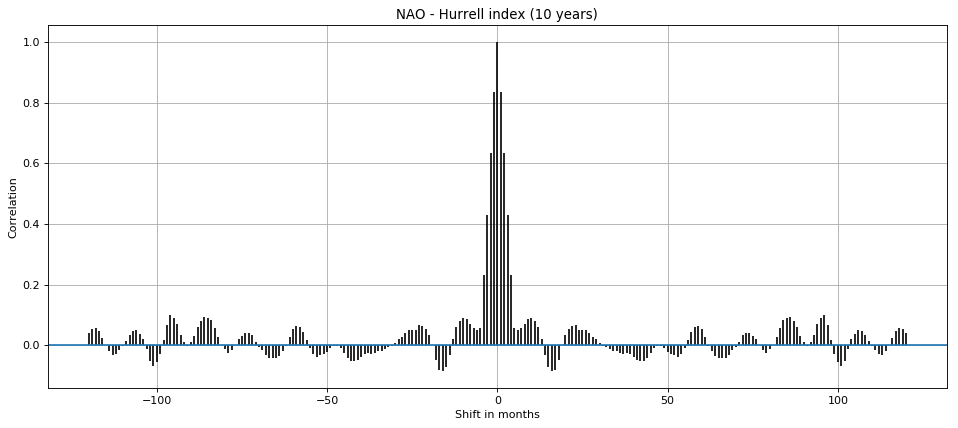

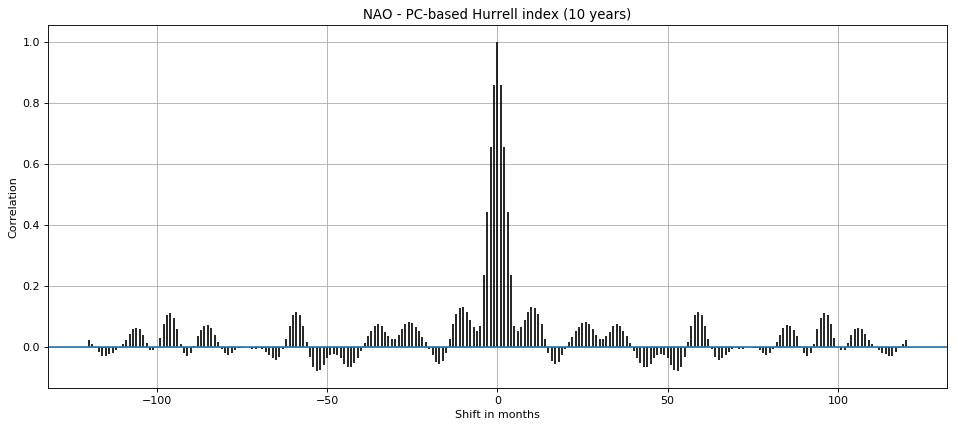

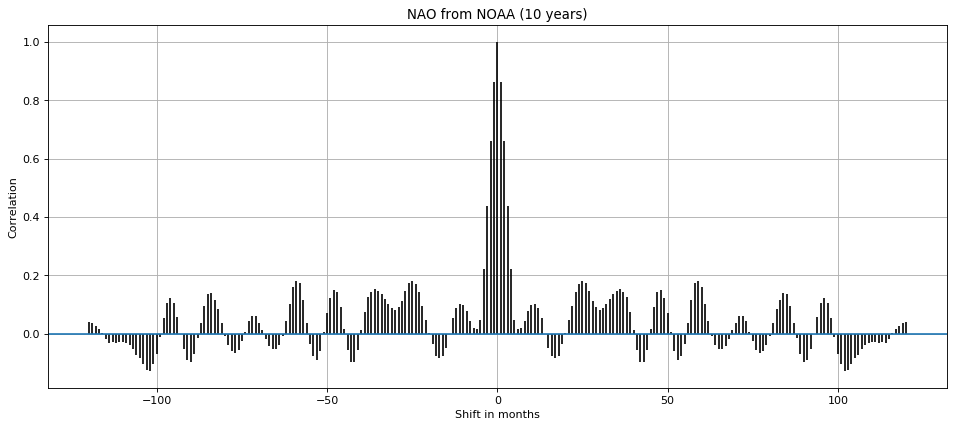

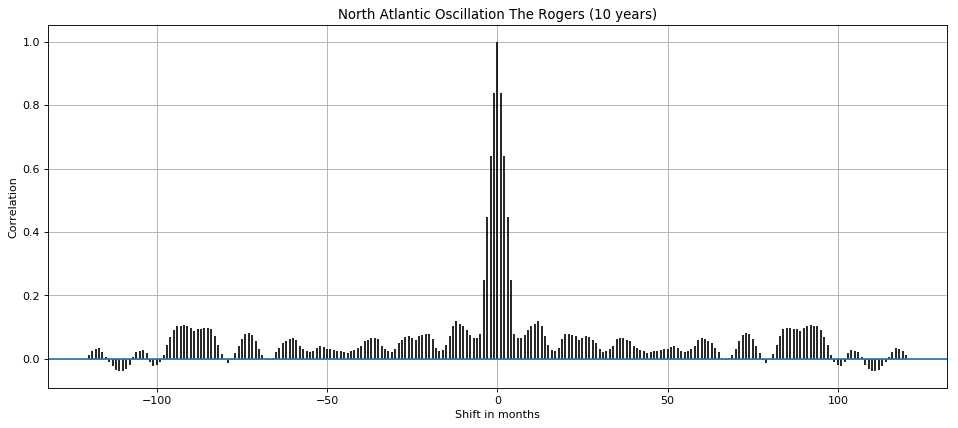

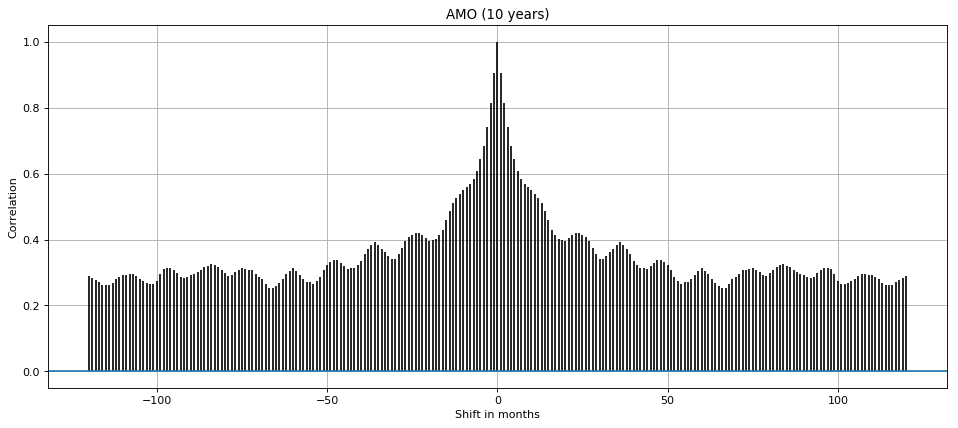

In [21]:
group_acorrelation_plot(enso, save_as='charts_and_tables/ENSO/autocorrelation/{}_autocorrelation.png' if SAVE else None)
group_acorrelation_plot(pdo, save_as='charts_and_tables/PDO/autocorrelation/{}_autocorrelation.png' if SAVE else None)
group_acorrelation_plot(operation_on_dict(nao, mask=np.ones(5)/5), save_as='charts_and_tables/NAO/autocorrelation/Smoothed_{}_autocorrelation.png' if SAVE else None)
group_acorrelation_plot(amo, save_as='charts_and_tables/AMO/autocorrelation/{}_autocorrelation.png' if SAVE else None)

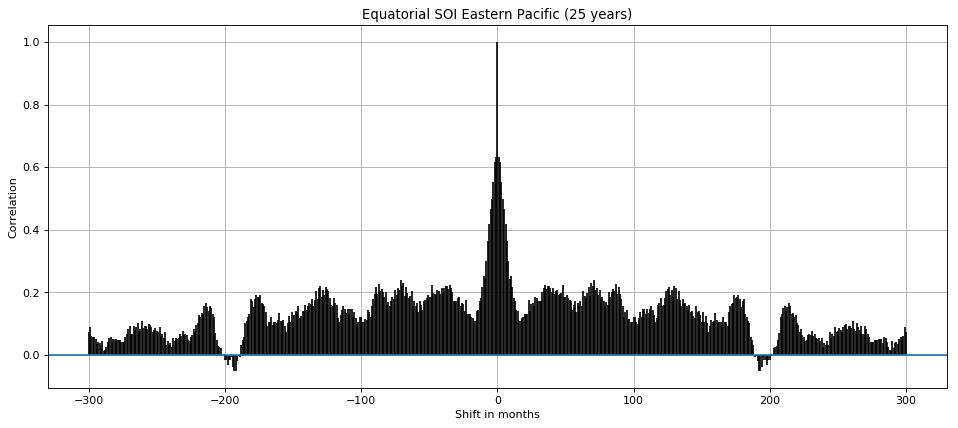

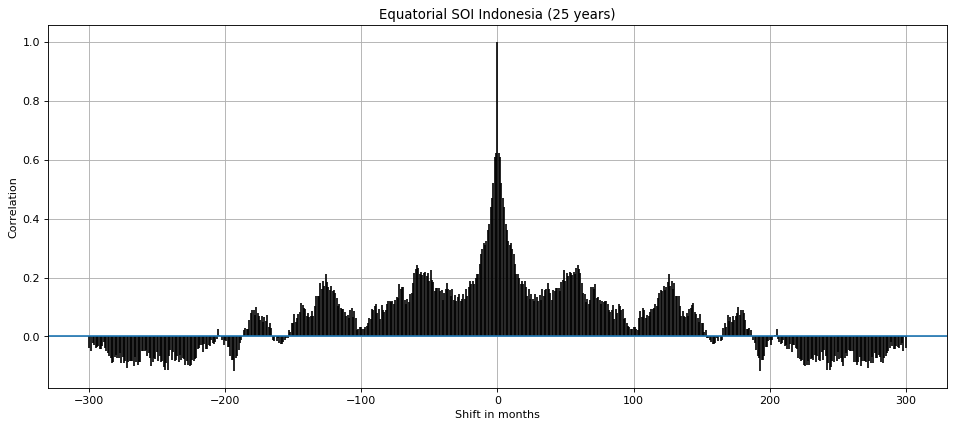

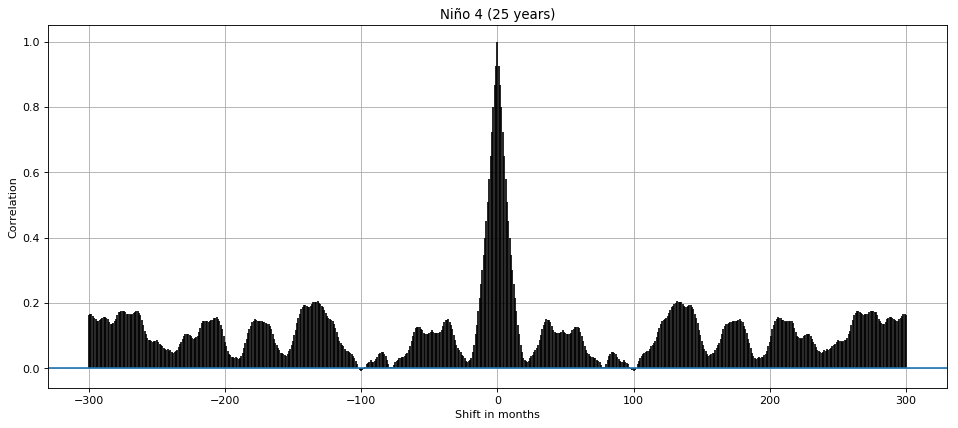

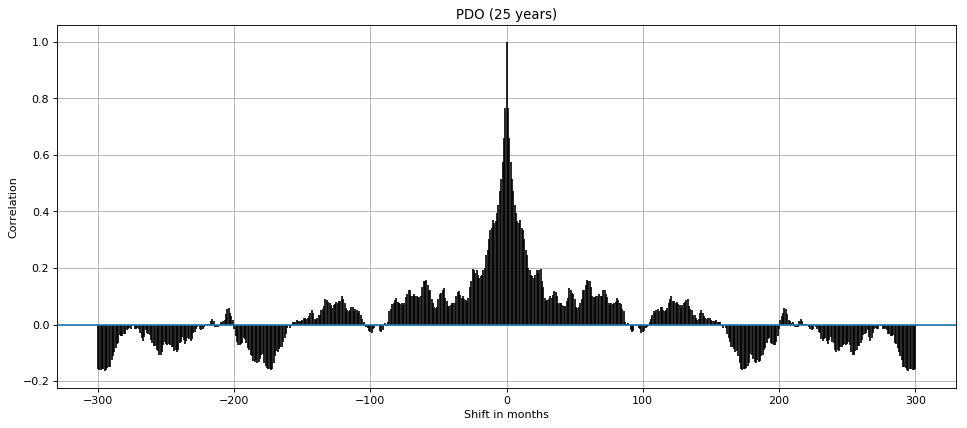

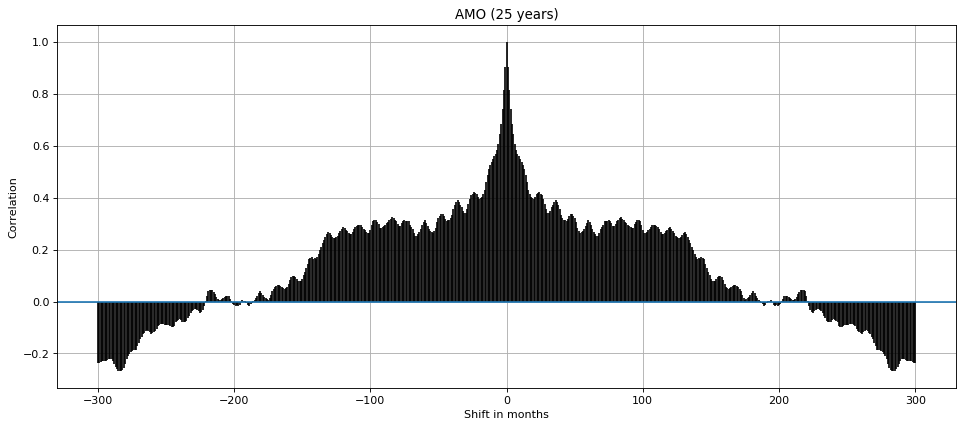

In [22]:
## 25 year autocorrelation

group_acorrelation_plot(select_keys(enso, "Equatorial SOI Eastern Pacific", "Equatorial SOI Indonesia", "Niño 4"),
        num_years=25, save_as='charts_and_tables/ENSO/autocorrelation/{}_autocorrelation_25y.png' if SAVE else None)
group_acorrelation_plot(pdo, num_years=25, save_as='charts_and_tables/PDO/autocorrelation/{}_autocorrelation_25y.png' if SAVE else None)
group_acorrelation_plot(amo, num_years=25, save_as='charts_and_tables/AMO/autocorrelation/{}_autocorrelation_25y.png' if SAVE else None)

## Crosscorrelation

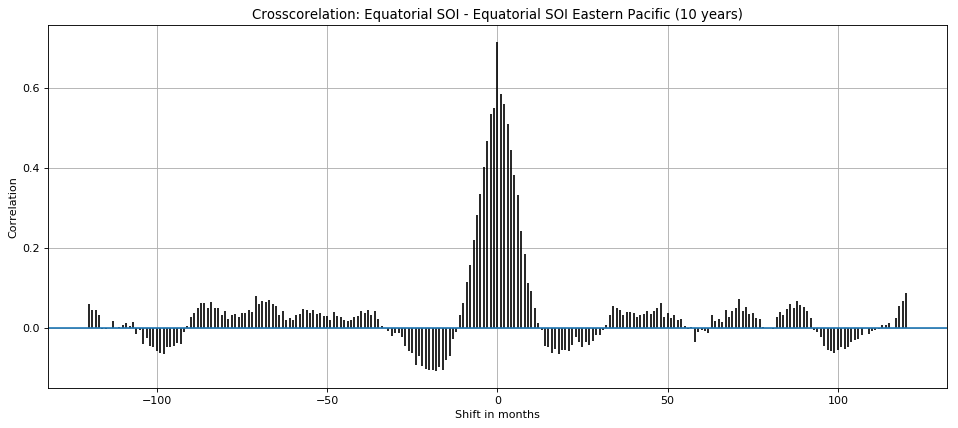

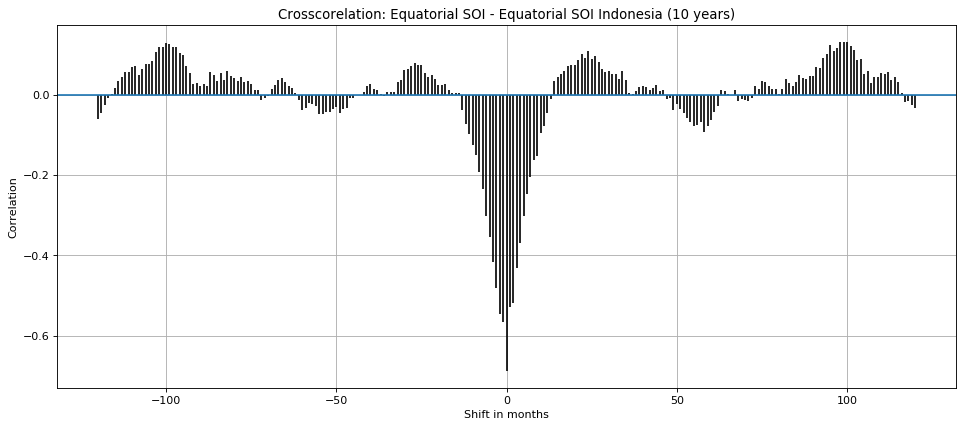

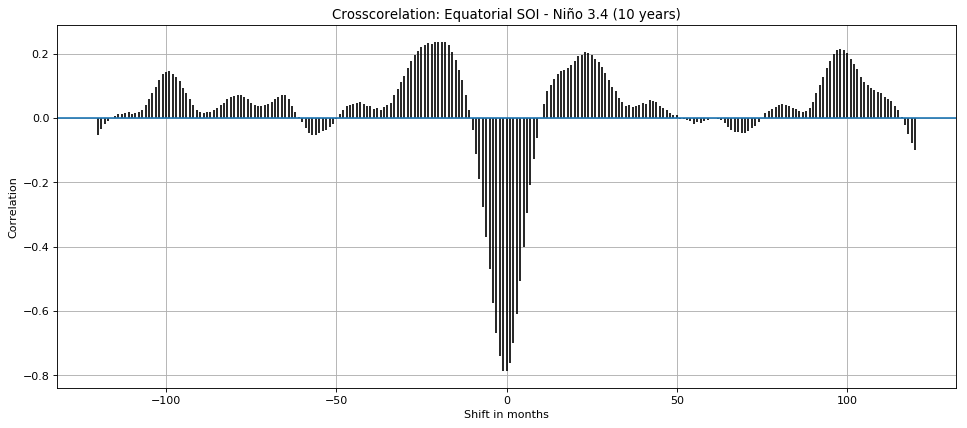

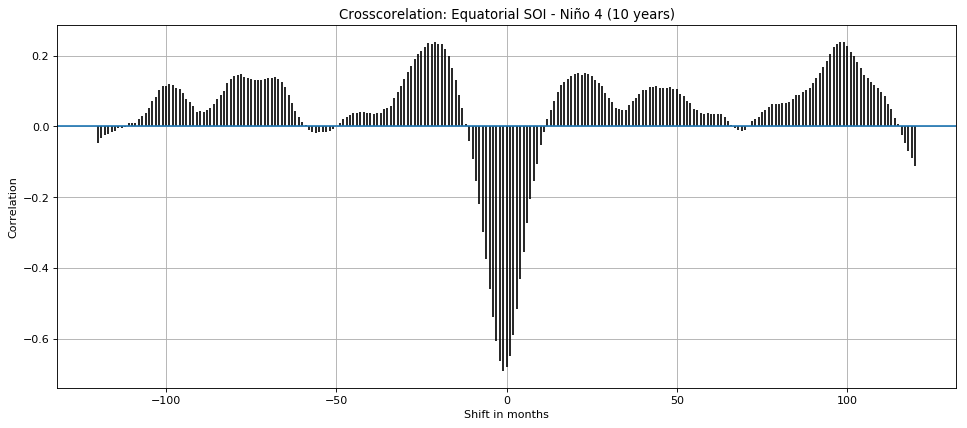

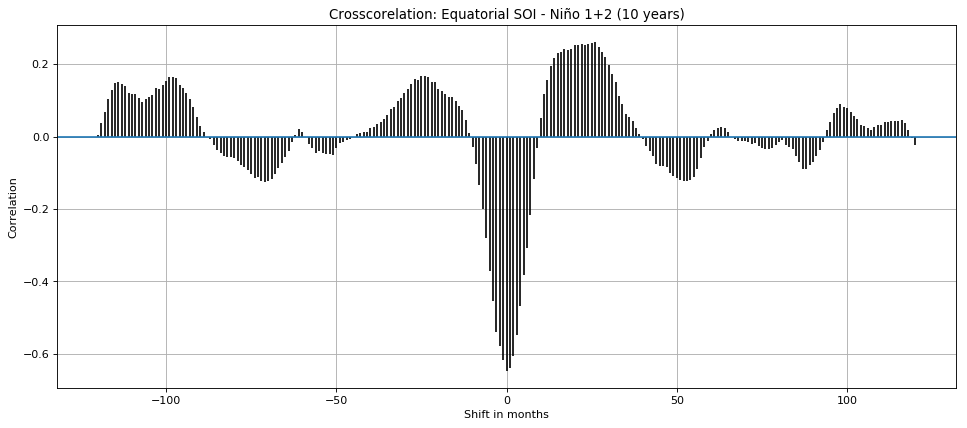

...

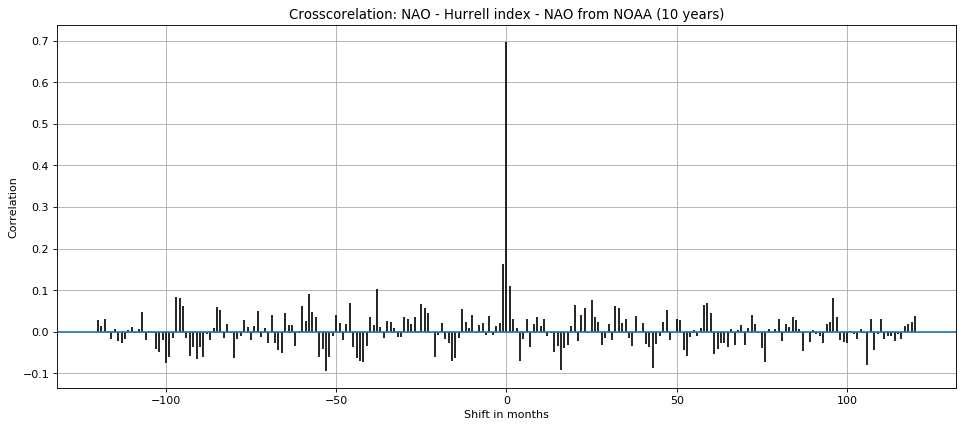

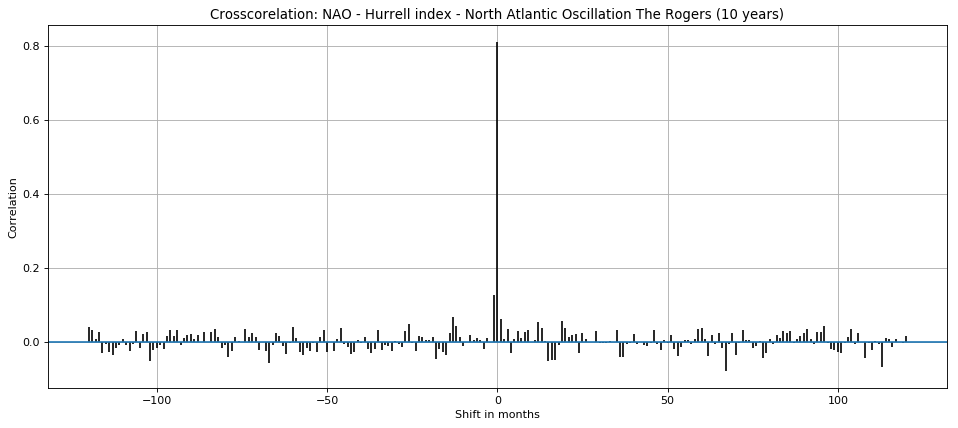

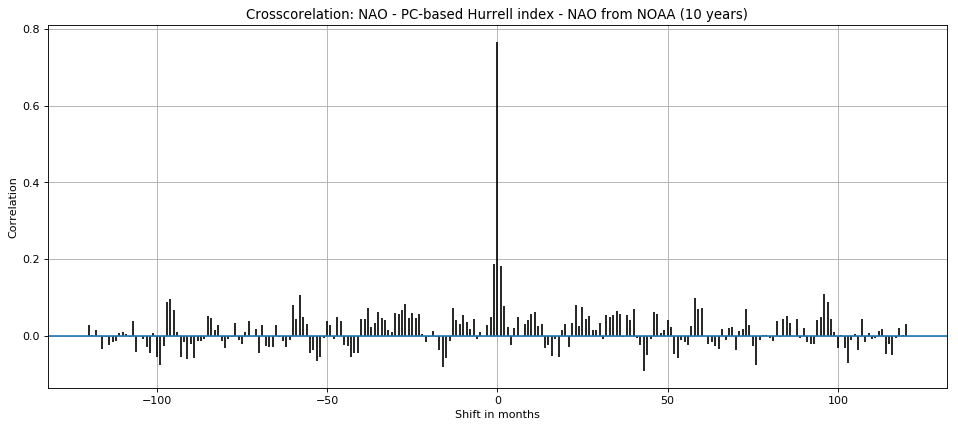

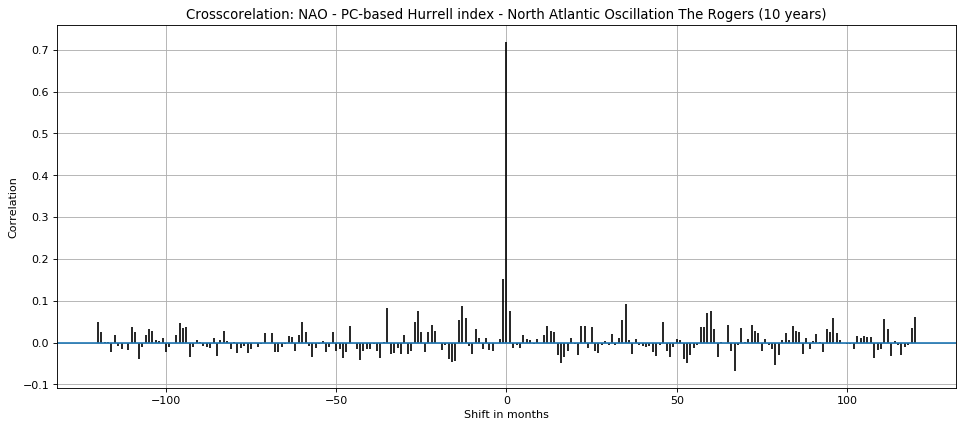

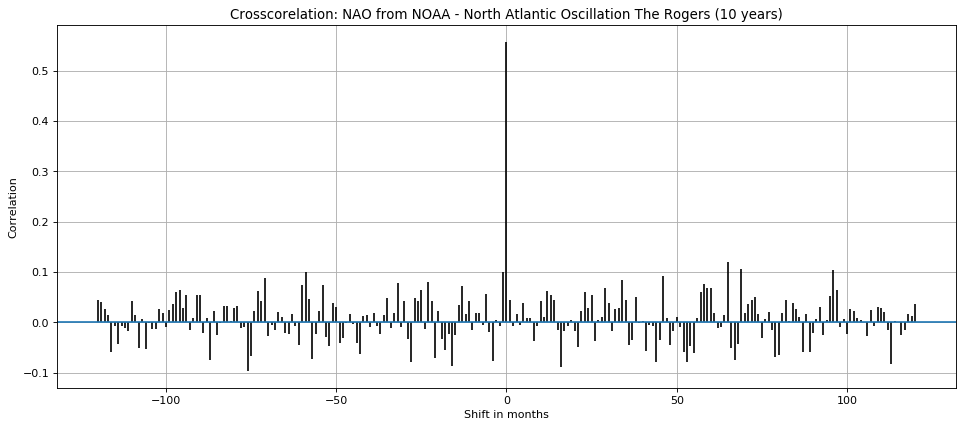

In [24]:
crosscorrelation_between_groups(enso, enso, save_as="charts_and_tables/ENSO/crosscorrelation/{}.png")
crosscorrelation_between_groups(nao, nao, save_as="charts_and_tables/NAO/crosscorrelation/{}.png")

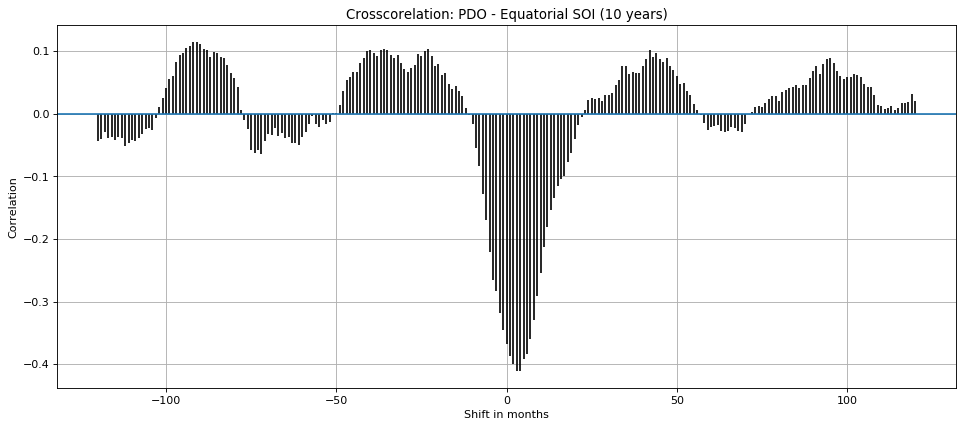

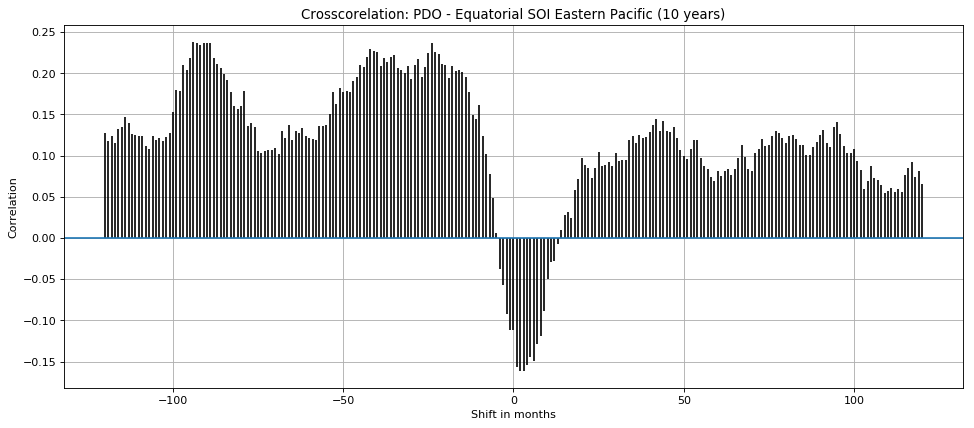

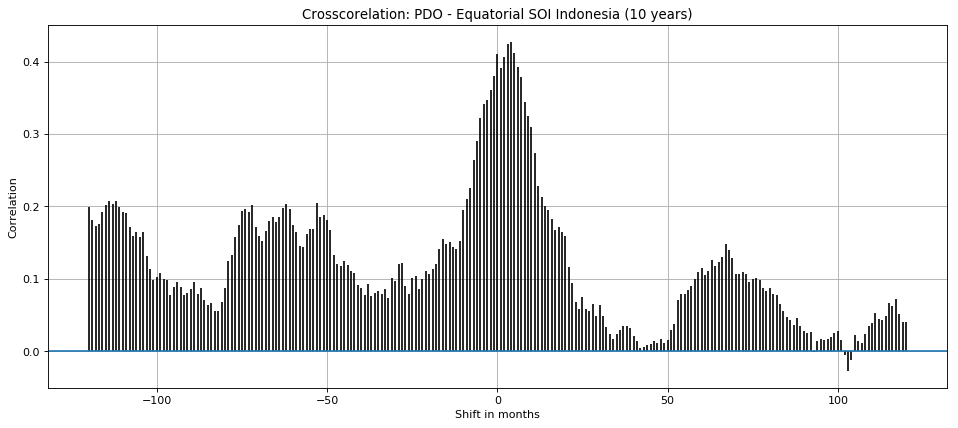

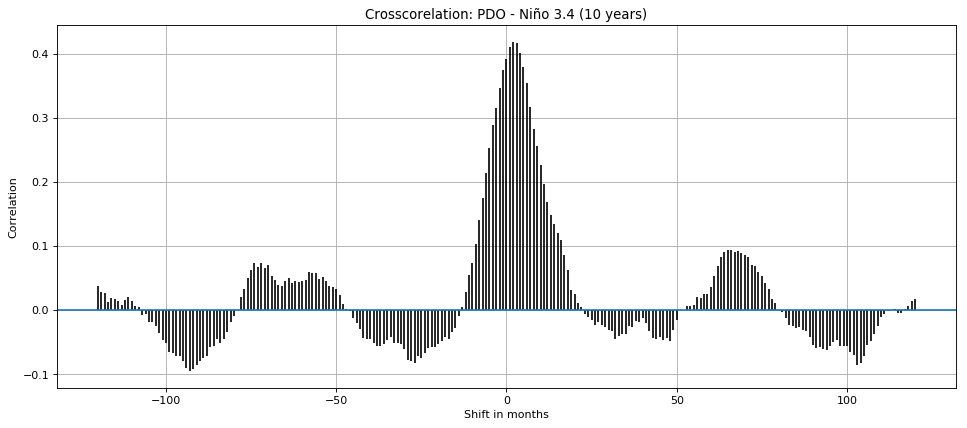

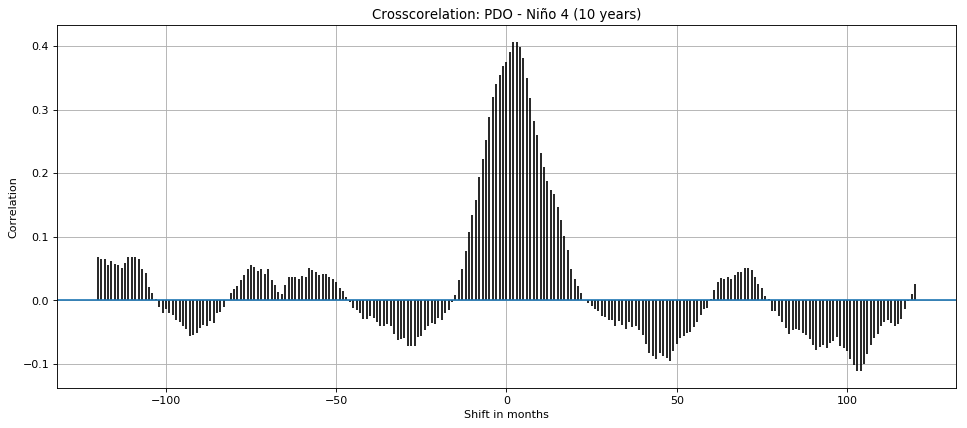

...

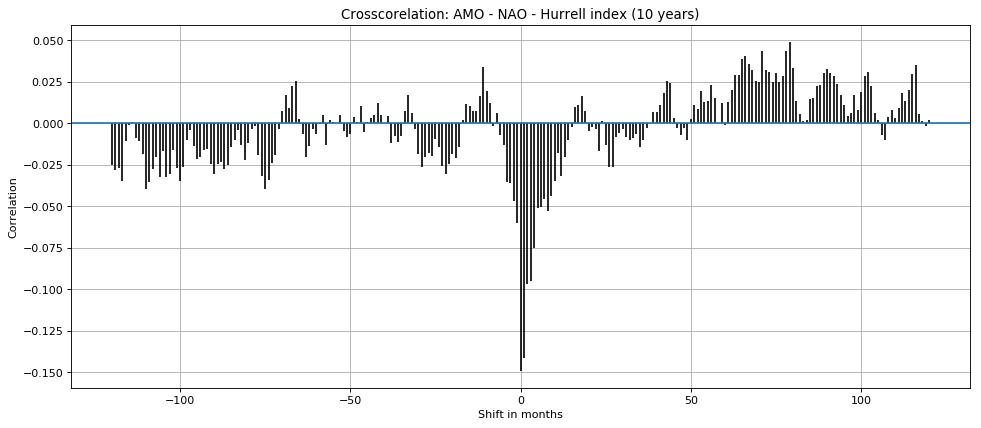

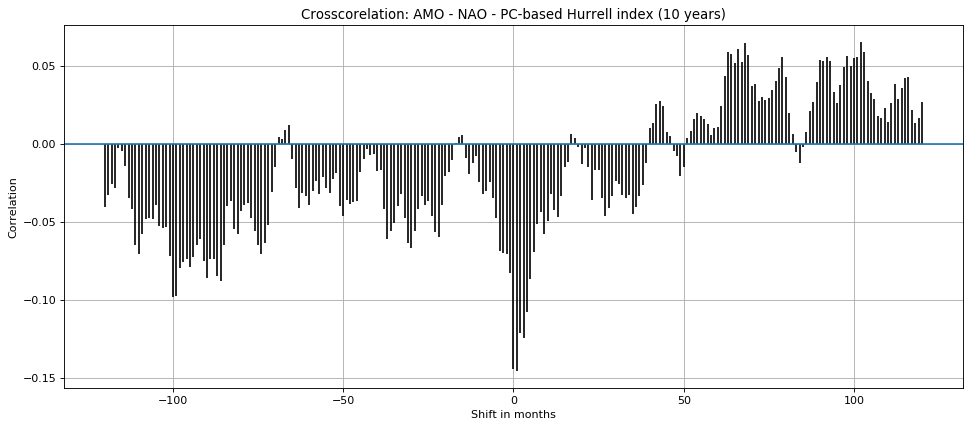

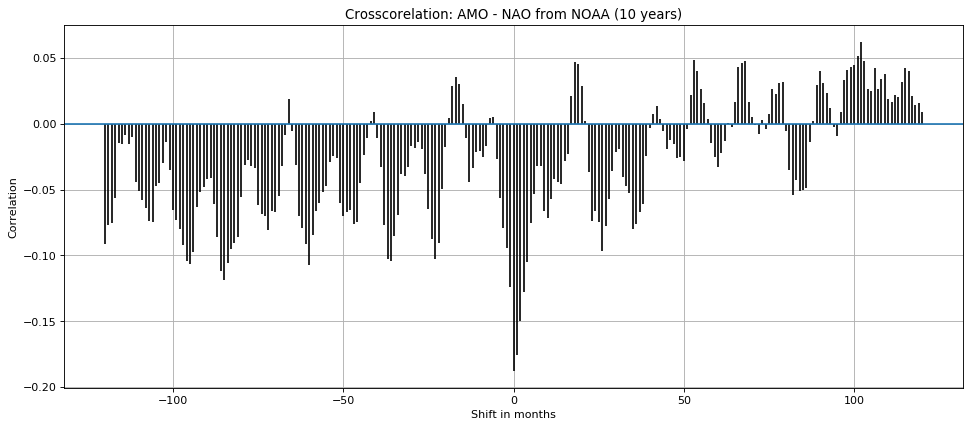

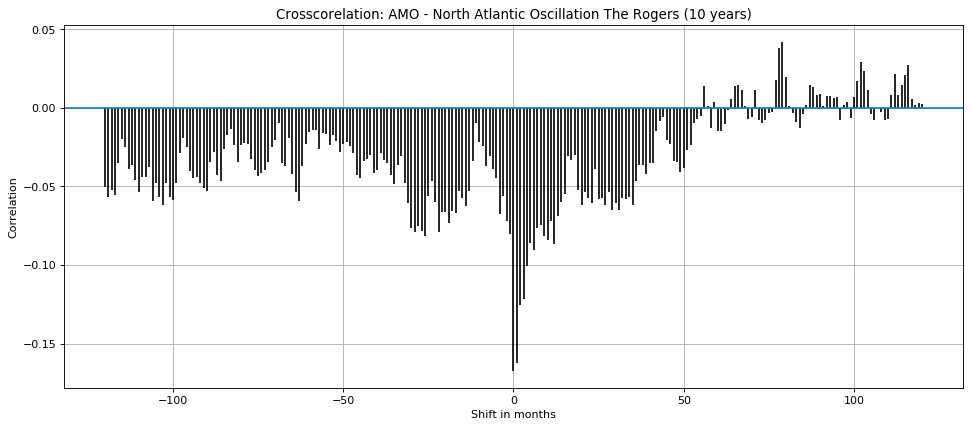

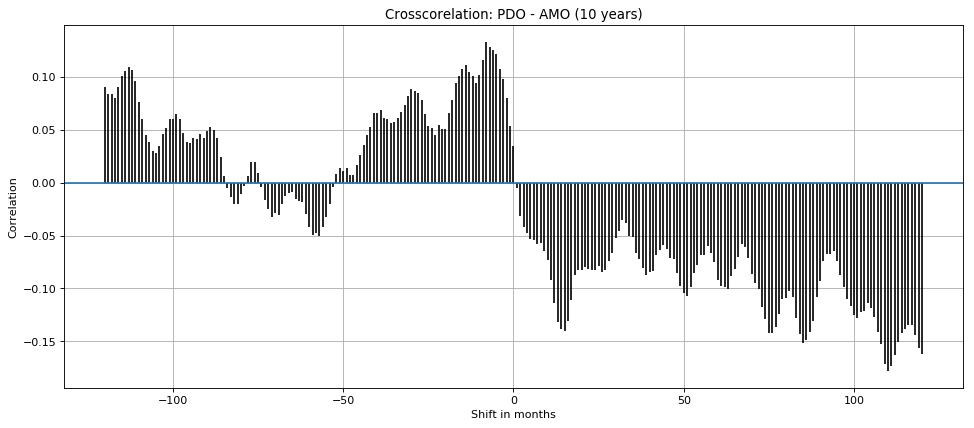

In [26]:
crosscorrelation_between_groups(pdo, enso, save_as="charts_and_tables/crosscorrelation_between_groups/crosscorrelation_pdo_enso/{}.png")
crosscorrelation_between_groups(amo, enso, save_as="charts_and_tables/crosscorrelation_between_groups/crosscorrelation_amo_enso/{}.png")
crosscorrelation_between_groups(nao, enso, save_as="charts_and_tables/crosscorrelation_between_groups/crosscorrelation_nao_enso/{}.png")
crosscorrelation_between_groups(pdo, nao, save_as="charts_and_tables/crosscorrelation_between_groups/crosscorrelation_pdo_nao/{}.png")
crosscorrelation_between_groups(amo, nao, save_as="charts_and_tables/crosscorrelation_between_groups/crosscorrelation_amo_nao/{}.png")
crosscorrelation_between_groups(pdo, amo, save_as="charts_and_tables/crosscorrelation_between_groups/crosscorrelation_pdo_amo/{}.png")

In [4]:
def group_plot(group: dict, title:str, save_as: str= None, since: str = None, add_space=None, legend_cols= 5):
    plt.figure(figsize=(14.5,6), dpi=80)
    legend=[]
    for name, ts in group.items():
        ts[since:].plot()
        legend.append(name)
    plt.legend(legend, bbox_to_anchor=(0., 0., 1., -0.09),ncol=legend_cols)
    if add_space is not None:
        plt.subplots_adjust(bottom=add_space)
    plt.title(title)
    plt.xlabel("Years")
    plt.ylabel("Values")
    plt.grid(True)
    if save_as is not None:
        plt.savefig(save_as)
    plt.show()

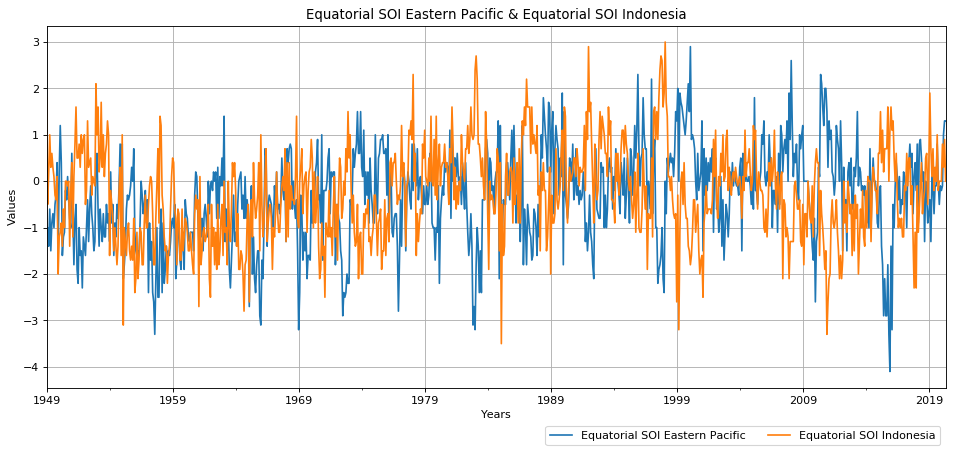

In [5]:
group_plot(select_keys(enso, 'Equatorial SOI Eastern Pacific', 'Equatorial SOI Indonesia'), 
          'Equatorial SOI Eastern Pacific & Equatorial SOI Indonesia')
           #save_as="charts_and_tables/ENSO/charts/group/Equatorial SOI Eastern Pacific & Equatorial SOI Indonesia.png")

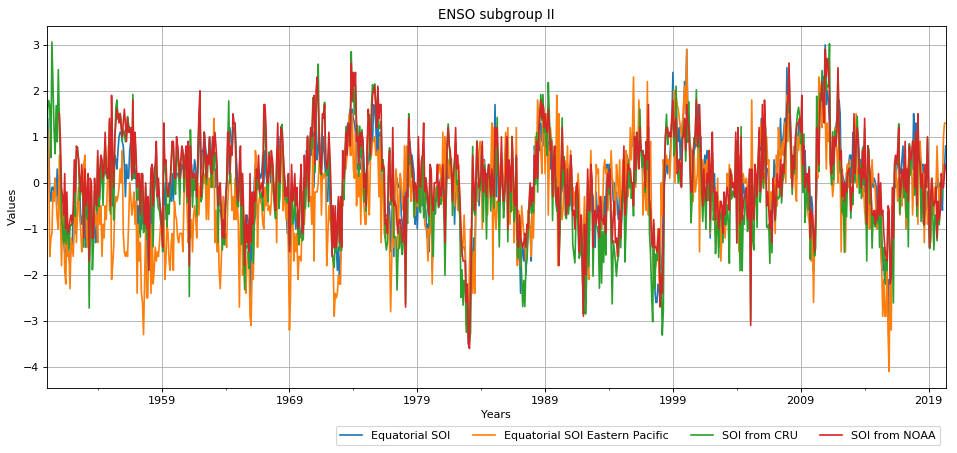

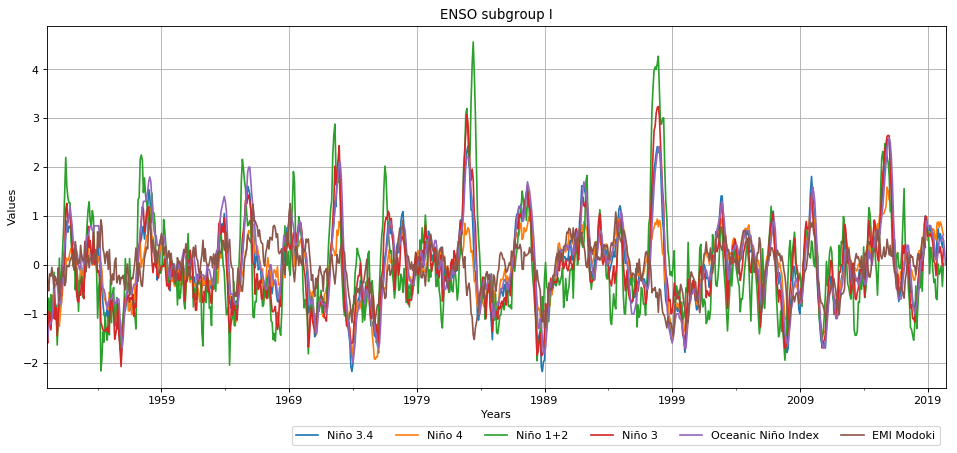

In [8]:
group_plot(drop_keys(enso, "Equatorial SOI Indonesia", "Niño 3.4", "Niño 4", "EMI Modoki", 
                    "Niño 1+2", "Niño 3", "Oceanic Niño Index", "SOI from Bureau of Meteorology"), 
                  "ENSO subgroup II", save_as="charts_and_tables/ENSO/charts/group/ENSO subgroup II", since="1950-01")
group_plot(drop_keys(enso, "Equatorial SOI", "Equatorial SOI Eastern Pacific", "SOI from Bureau of Meteorology",
                    "SOI from CRU", "SOI from NOAA", "Equatorial SOI Indonesia"),
                   "ENSO subgroup I", save_as="charts_and_tables/ENSO/charts/group/ENSO subgroup I", 
           since="1950-01", legend_cols=6)

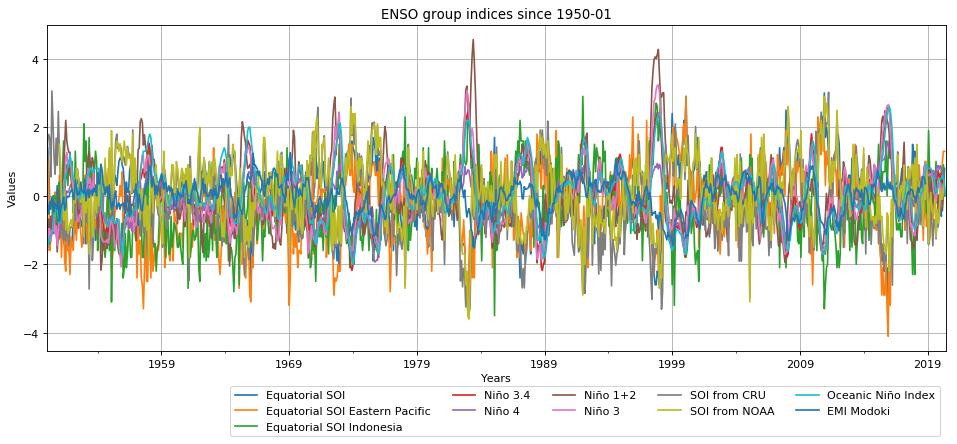

In [30]:
group_plot(drop_keys(enso, 'SOI from Bureau of Meteorology'),
           "ENSO group indices since 1950-01",
           save_as = "charts_and_tables/ENSO/charts/group/ENSO group indices without SOI from BoM since 1950-01.png", 
           since='1950-1', add_space=.2)

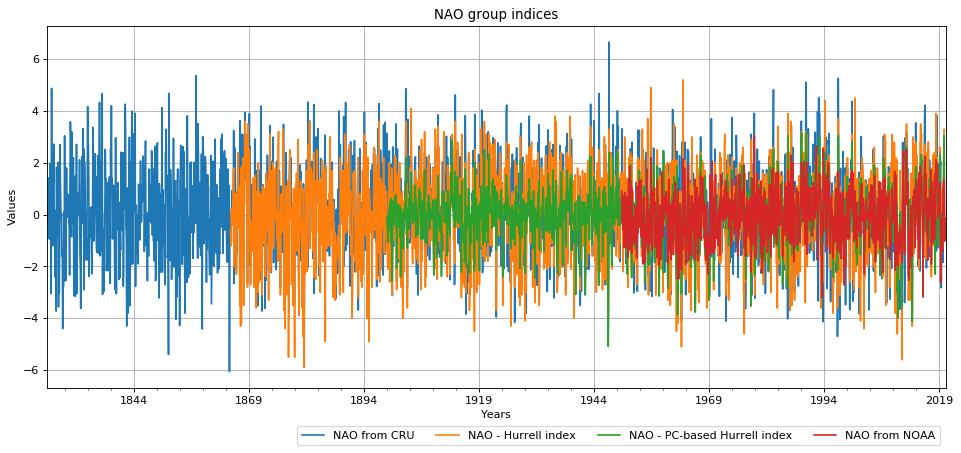

In [16]:
group_plot(drop_keys(nao, 'North Atlantic Oscillation The Rogers'),
           "NAO group indices",
           save_as = "charts_and_tables/NAO/charts/group/NAO group indices.png")

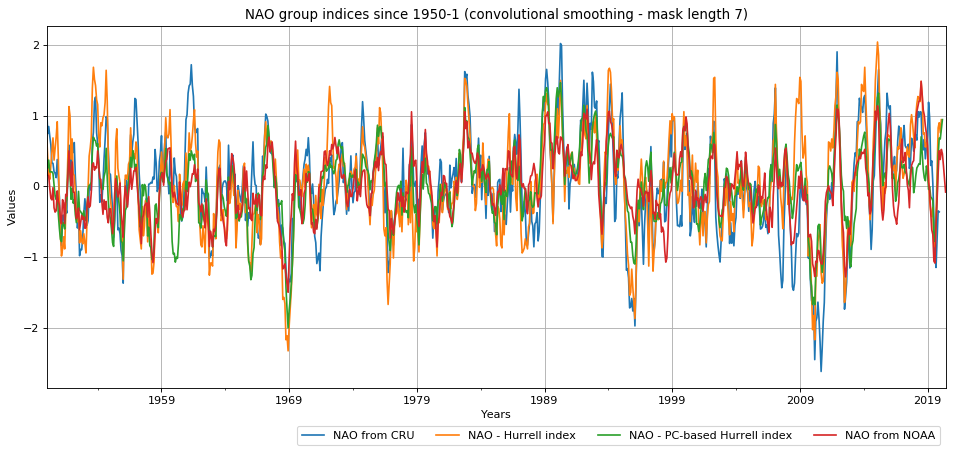

In [12]:
title = "NAO group indices since 1950-1 (convolutional smoothing - mask length {})".format(7)
group_plot(operation_on_dict(drop_keys(nao, 'North Atlantic Oscillation The Rogers'), 
                            mask=np.ones(7)/7),
           title,
           save_as = "charts_and_tables/NAO/charts/group/" + title + ".png",
           since="1950-01")

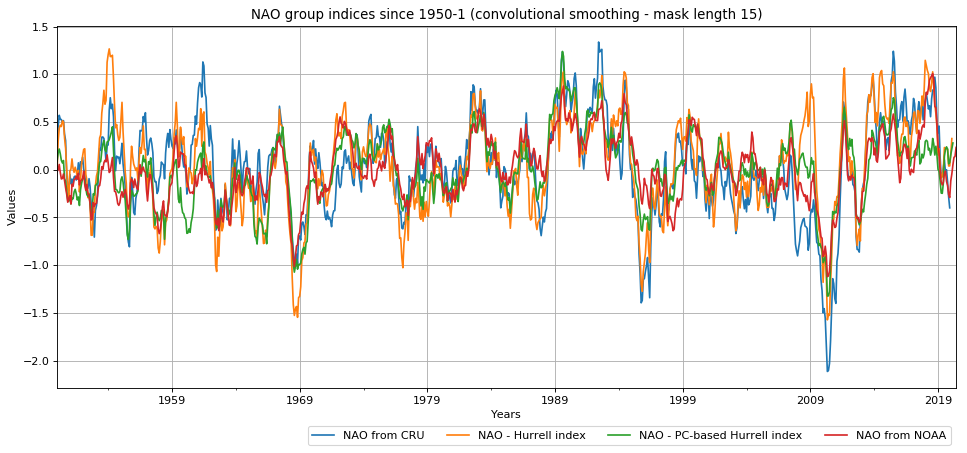

In [13]:
title = "NAO group indices since 1950-1 (convolutional smoothing - mask length {})".format(15)
group_plot(operation_on_dict(drop_keys(nao, 'North Atlantic Oscillation The Rogers'), 
                            mask=np.ones(15)/15),
           title,
           save_as = "charts_and_tables/NAO/charts/group/" + title + ".png",
           since="1950-01")

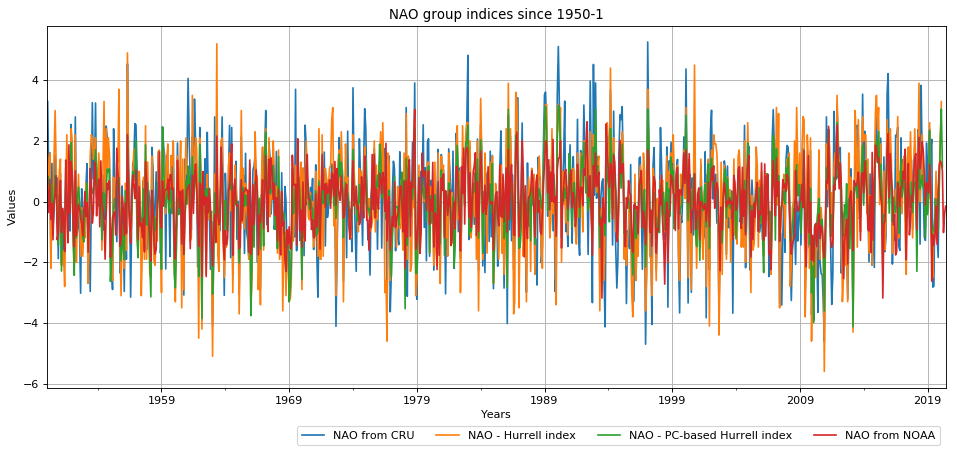

In [15]:
group_plot(drop_keys(nao, 'North Atlantic Oscillation The Rogers'),
           "NAO group indices since 1950-1",
           save_as = "charts_and_tables/NAO/charts/group/NAO group indices since 1950-1.png", 
           since="1950-01")

In [36]:
import numpy as np
from waveletFunctions import wavelet, wave_signif
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
import matplotlib.ticker as ticker
from mpl_toolkits.axes_grid1 import make_axes_locatable

def wavelets(data, name, save_as=None):
    if len(data)%2!=0:
        data = data[1:]
    
    data = (data-np.mean(data))/np.std(data)
    variance = np.std(data, ddof=1) ** 2

    n = len(data)
    dt = 1/12
    time = np.arange(len(data)) * dt + data.index[0].year  # construct time array
    xlim = ([data.index[0].year, data.index[-1].year])  # plotting range
    pad = 1  # pad the time series with zeroes (recommended)
    dj = 0.01  # this will do 100 sub-octaves per octave
    s0 = .5  # this says start at a scale of 6 months
    j1 = 7 / dj  # this says do 7 powers-of-two with dj sub-octaves each
    lag1 = pycwt.ar1(data)[0] #0.72  # lag-1 autocorrelation for red noise background
    mother = 'MORLET'

    wave, period, scale, coi = wavelet(data, dt, pad, dj, s0, j1, mother)
    power = (np.abs(wave)) ** 2  # compute wavelet power spectrum
    global_ws = (np.sum(power, axis=1) / n)  # time-average over all times
    period_idx = np.where(global_ws==np.max(global_ws[:int(np.max(np.where(scale<=np.max(coi))))]))
    # Significance levels:
    signif = wave_signif(([variance]), dt=dt, sigtest=0, scale=scale,
        lag1=lag1, mother=mother)


    sig95 = signif[:, np.newaxis].dot(np.ones(n)[np.newaxis, :])  # expand signif --> (J+1)x(N) array
    sig95 = power / sig95  # where ratio > 1, power is significant

    # Global wavelet spectrum & significance levels:
    dof = n - scale  # the -scale corrects for padding at edges
    global_signif = wave_signif(variance, dt=dt, scale=scale, sigtest=1,
        lag1=lag1, dof=dof, mother=mother)

    # Scale-average between El Nino periods of 2--8 years
    avg = np.logical_and(scale >= 2, scale < 8)
    Cdelta = 0.776  # this is for the MORLET wavelet
    scale_avg = scale[:, np.newaxis].dot(np.ones(n)[np.newaxis, :])  # expand scale --> (J+1)x(N) array
    scale_avg = power / scale_avg  # [Eqn(24)]
    scale_avg = dj * dt / Cdelta * sum(scale_avg[avg, :])  # [Eqn(24)]
    scaleavg_signif = wave_signif(variance, dt=dt, scale=scale, sigtest=2,
        lag1=lag1, dof=([2, 7.9]), mother=mother)
    time_idx = np.where(scale_avg==np.max(scale_avg))
    
    plt.close('all')
    plt.ioff()
    figprops = dict(figsize=(11, 8), dpi=72)
    fig = plt.figure(**figprops)

    bx = plt.axes([0.1, 0.37, 0.65, 0.28])
    levels = [0.0625, 0.125, 0.25, 0.5, 1, 2, 4, 8, 16]
    bx.contourf(time, np.log2(period), np.log2(power), np.log2(levels),
                extend='both', cmap=pyplot.cm.viridis)
    extent = [time.min(), time.max(), 0, max(period)]
    bx.contour(time, np.log2(period), sig95, [-99, 1], colors='r', linewidths=2,
               extent=extent)
    bx.fill(
            np.concatenate([time, time[-1:] + dt, time[-1:] + dt,
                               time[:1] - dt, time[:1] - dt]),
            np.concatenate([np.log2(coi), [-9e-1], np.log2(period[-1:]),
                               np.log2(period[-1:]), [-9e-1]]),
            'k', alpha=0.3, hatch='x')
    bx.set_title('a) {} - Wavelet Power Spectrum'.format(name))
    bx.set_ylabel('Period (years)')
    bx.set_xlabel('Time (year)')
    bx.grid(True)

    Yticks = 2 ** np.arange(np.ceil(np.log2(period.min())),
                               np.ceil(np.log2(period.max())))
    bx.set_yticks(np.log2(Yticks))
    bx.set_yticklabels(Yticks)
    bx.set_xlim([time.min(), time.max()])

    cx = plt.axes([0.77, 0.37, 0.2, 0.28], sharey=bx)
    cx.plot(global_signif, np.log2(period), 'k--')

    cx.plot(variance * global_ws, np.log2(period), 'k-', linewidth=1.5)
    cx.set_title('b) Global Wavelet Spectrum')
    cx.set_xlabel(r'Power')
    cx.set_xlim([0, global_ws.max() + variance])
    cx.set_ylim(np.log2([period.min(), period.max()]))
    cx.set_yticks(np.log2(Yticks))
    cx.set_yticklabels(Yticks)
    cx.grid(True)
    plt.setp(cx.get_yticklabels(), visible=False)
    if save_as is not None:
        plt.savefig(save_as.format(name, format='png'))
    plt.show()
    
    return round(scale[period_idx[0]][0] *1000)/1000, time[time_idx[0]][0], pd.Series(data=scale_avg, index=data.index)

/home/imegirin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:68: RuntimeWarning: divide by zero encountered in log2


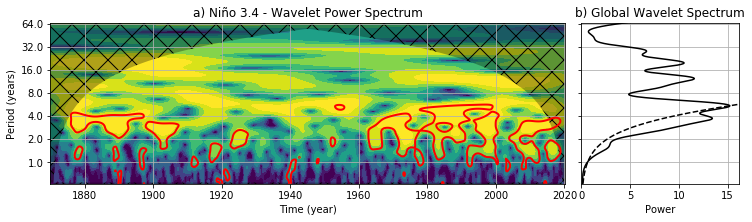

(5.205, 1987.8333333333333, 1870-01    0.115162
 1870-02    0.118045
 1870-03    0.120917
 1870-04    0.123779
 1870-05    0.126632
              ...   
 2019-12    0.321065
 2020-01    0.311787
 2020-02    0.302579
 2020-03    0.293449
 2020-04    0.284404
 Freq: M, Length: 1804, dtype: float64)

In [37]:
wavelets(enso['Niño 3.4'], 'Niño 3.4')

/home/imegirin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:68: RuntimeWarning: divide by zero encountered in log2


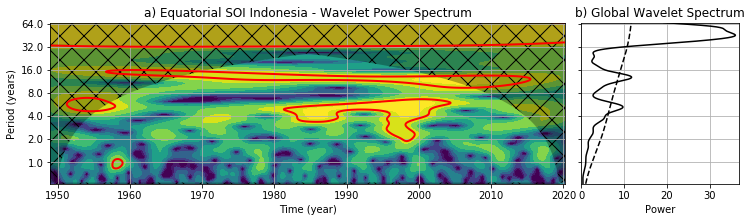

(12.295, 1997.6666666666667, 1949-02    0.170442
 1949-03    0.174912
 1949-04    0.179338
 1949-05    0.183710
 1949-06    0.188019
              ...   
 2020-01    0.152103
 2020-02    0.148246
 2020-03    0.144368
 2020-04    0.140477
 2020-05    0.136580
 Freq: M, Length: 856, dtype: float64)

In [38]:
wavelets(enso['Equatorial SOI Indonesia'], 'Equatorial SOI Indonesia')

In [39]:
def wavelet_group(group, group_name, save_as=None):
    scl_avgd_grp = []
    hgst_pwr_prds = []
    hgst_pwr_dtes = []
    nms = []
    for key, item in group.items():
        nms.append(key)
        
        hgst_pwr_prd, hgst_pwr_dte, scl_avgd = wavelets(item, key, save_as)
        
        scl_avgd_grp.append(scl_avgd)
        hgst_pwr_prds.append(hgst_pwr_prd)
        hgst_pwr_dtes.append(hgst_pwr_dte)
    
    hgst_pwr_dtes = ['-'.join([str(int(d)), str(int(round(((d - d//1)*12))))]) for d in hgst_pwr_dtes]
    df = pd.DataFrame({'Index':nms, 
                       'Highest power period [yrs]': hgst_pwr_prds, 
                       'Highest power date': hgst_pwr_dtes})
    if save_as is not None:
        df.to_csv(save_as.split('.')[0].format("Highest power table.csv"))
        
    plot_averaged_wave_power(scl_avgd_grp, nms, group_name, save_as)
    
def plot_averaged_wave_power(series, names, group_name, save_as=None):
    fig = plt.figure(figsize=(14, 8))
    for name, srs in zip(names, series):
        plt.plot(srs.index.to_timestamp(), srs.values, label = name)
    plt.legend()
    plt.ylabel(u'Average variance')
    plt.xlabel('Time (year)')
    plt.title("Scale-averaged wavelet powers for {} group".format(group_name))
    plt.grid(True)
    if save_as is not None:
        plt.savefig(save_as.format("Scale-averaged wavelet powers for {} group".format(group_name)))
    plt.show()

/home/imegirin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:68: RuntimeWarning: divide by zero encountered in log2


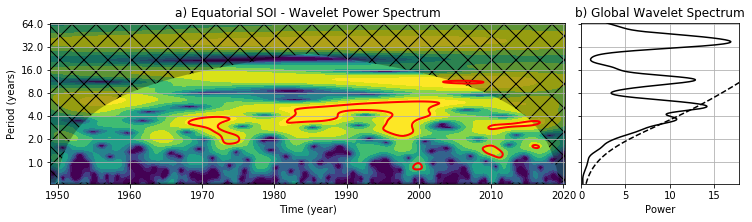

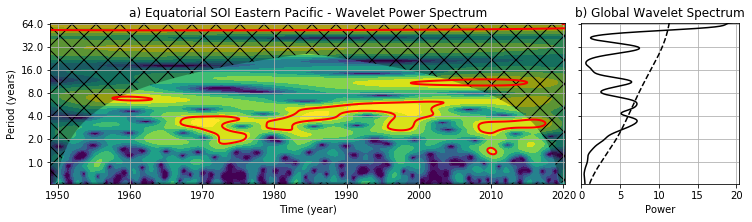

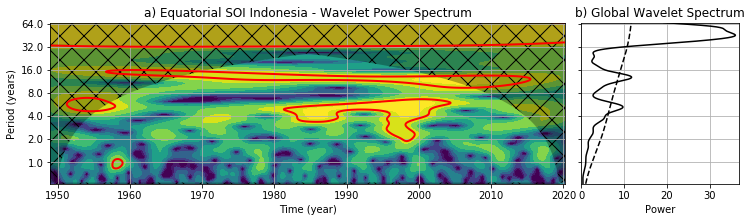

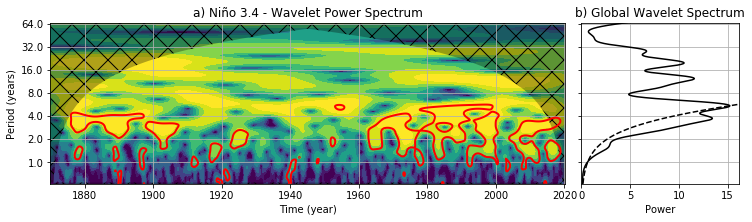

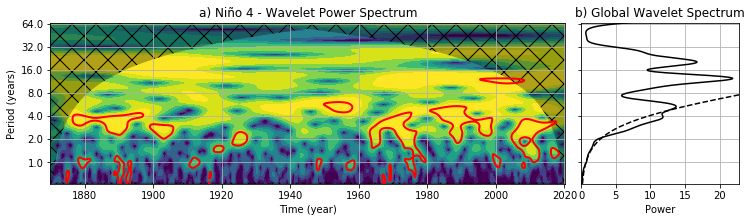

...

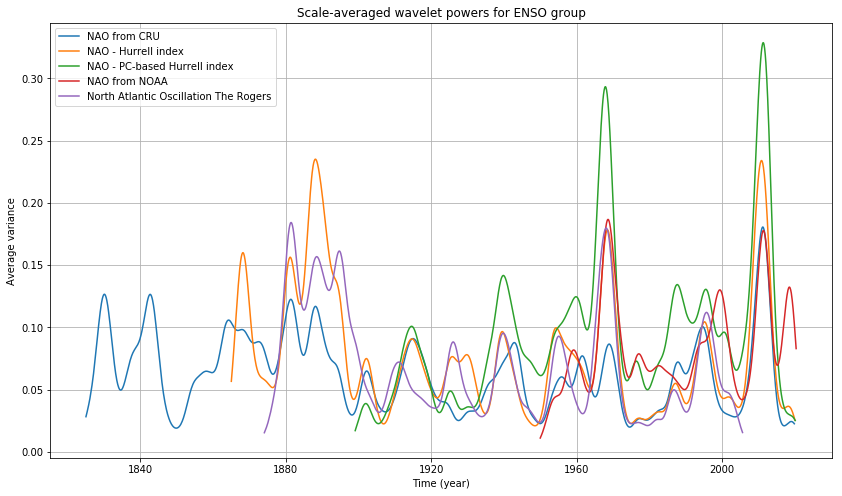

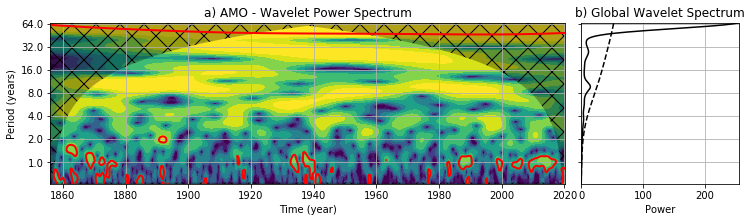

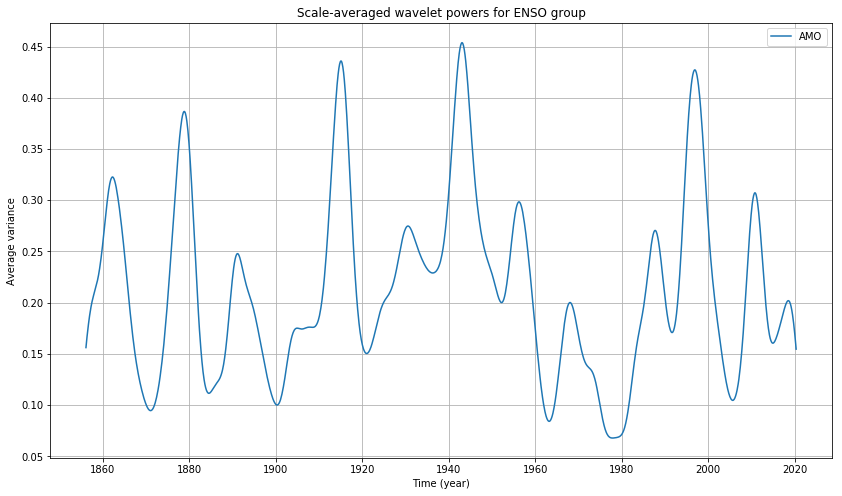

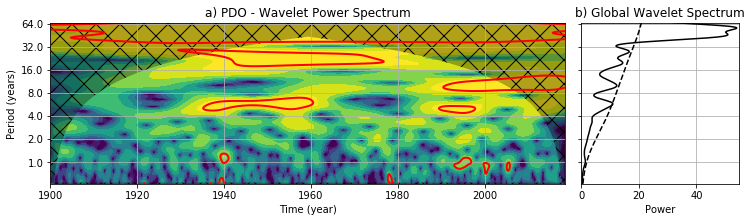

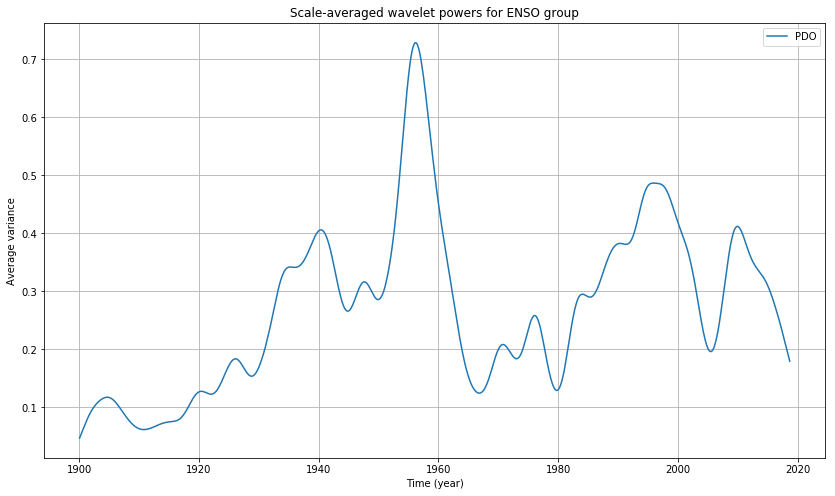

In [40]:
wavelet_group(enso, "ENSO", save_as="charts_and_tables/ENSO/wavelets/{}.png")
wavelet_group(nao, "ENSO", save_as="charts_and_tables/NAO/wavelets/{}.png")
wavelet_group(amo, "ENSO", save_as="charts_and_tables/AMO/wavelets/{}.png")
wavelet_group(pdo, "ENSO", save_as="charts_and_tables/PDO/wavelets/{}.png")